<a href="https://colab.research.google.com/github/fernandafs/8-rainhas/blob/main/Projeto_PM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Projeto - Programação Matemática [2023.Q3]**

## Objetivos

Os objetivos deste projeto são:
* A familiarização com modelos de otimização linear para a construção de portfolios de ativos financeiros que ofereçam,
ao mesmo tempo, “bons” retornos ao capital inicial investido e uma “certa” proteção ao risco inerente envolvido em
tais operações;
* A familiarização com a linguagem de modelagem AMPL e sua utilização via Python no ambiente Colab da Google;
* A experimentação/solução dos modelos com dados reais (obtidos da plataforma Yahoo Finance) via solvers de
otimização linear;
* Uma ligeira análise dos resultados devolvidos pelos solvers.

Referência técnica: https://mo-book.ampl.com/notebooks/02/mad-portfolio-optimization.html

Referência teórica: https://www.andrew.cmu.edu/user/gc0v/webpub/book.pdf

## EQUIPE

**Nome:** Fernanda Felix da Silva

**RA:** 11201921613

**Nome:** Leonel Artuzi

**RA:** 11201921934

**Nome:**

**RA:**

## Configurações Iniciais

In [2]:
# install dependencies and select solver
%pip install -q amplpy numpy matplotlib scikit-learn yfinance

SOLVER = "highs"

from amplpy import AMPL, ampl_notebook

ampl = ampl_notebook(
    modules=["highs"],  # modules to install
    license_uuid="default",  # license to use
)  # instantiate AMPL object and register magics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 36.7 MB/s eta 0:00:00
Using default Community Edition License for Colab. Get yours at: https://ampl.com/ce
Licensed to AMPL Community Edition License for the AMPL Model Colaboratory (https://colab.ampl.com).


In [3]:
# instalação do yahoo finance para busca das informações das ações escolhidas
%pip install yfinance --upgrade -q

In [4]:
# Bibliotecas importadas
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
import datetime as datetime
import yfinance as yf
from scipy.optimize import minimize
import datetime as dt

### 1. Escolha 30 ações de empresas brasileiras e execute os códigos disponíveis para diferentes valores mínimos requeridos de retorno de portfolio e diferentes períodos de tempo. Reporte diferenças significativas, caso existam.

**Parte 1.a.** Listagem das 30 ações brasileiras e criação do gráfico de histórico de preços - Gráfico ajustado e gráfico com escala.

obs: Para a variação de períodos de tempo e valores mínimos futuramente, foi feito o gráfico para o período de 1 ano, 2 anos e 3 anos.

[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  30 of 30 completed
[*********************100%%**********************]  30 of 30 completed


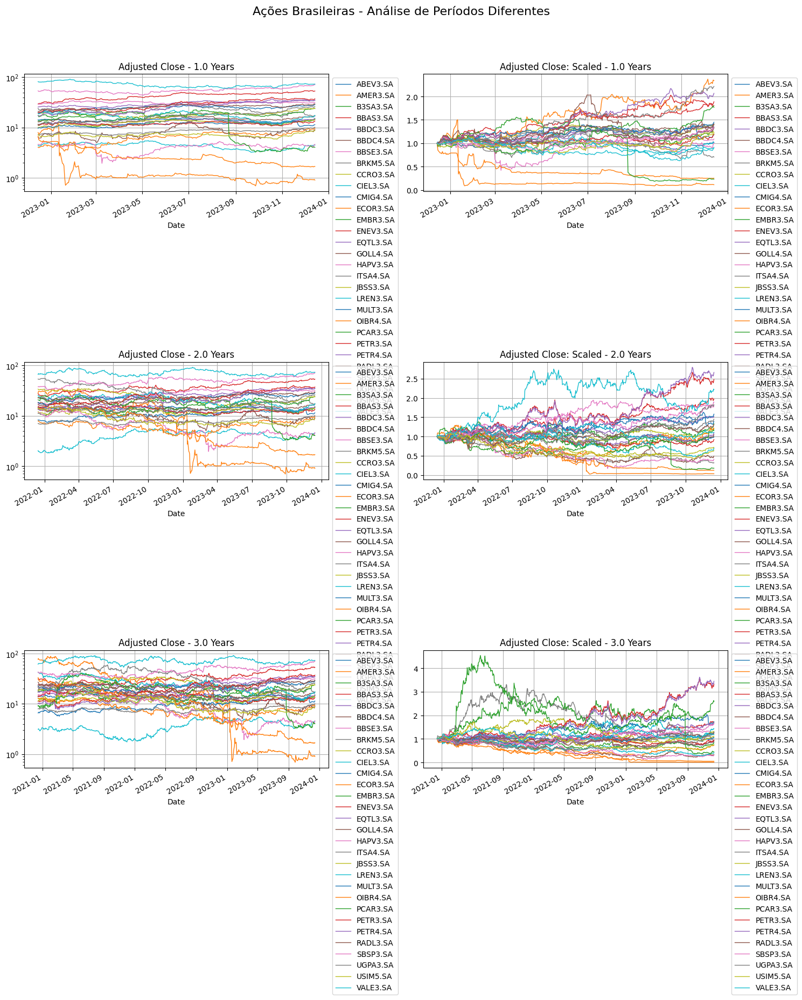

In [45]:
# list de 30 ações brasileiras (códigos)
tickers = [
    "RADL3.SA",	#Raia Drogasil S.A.
    "ENEV3.SA", #ENEVA
    "GOLL4.SA", #GOL Linhas aéreas
    "MULT3.SA",	#Multiplan Empreendimentos Imobiliários S.A.
    "JBSS3.SA",	#JBS
    "BBAS3.SA",	#Banco do Brasil S.A.
    "UGPA3.SA",	#Ultrapar Participações S.A.
    "PETR4.SA",	#Petróleo Brasileiro S.A. - Petrobras
    "USIM5.SA",	#Usinas Siderúrgicas de Minas Gerais S.A.
    "OIBR4.SA",	#Oi S.A.
    "EQTL3.SA",	#Equatorial Energia S.A.
    "BBDC4.SA",	#Banco Bradesco S.A.
    "ITSA4.SA",	#Itaúsa S.A.
    "B3SA3.SA", #B3
    "CCRO3.SA",	#CCR S.A.
    "BBDC3.SA",	#Banco Bradesco S.A.
    "ECOR3.SA",	#EcoRodovias Infraestrutura e Logística S.A.
    "CIEL3.SA", #CIELO
    "PCAR3.SA",	#Pão de açucar
    "CMIG4.SA",	#Companhia Energética de Minas Gerais - CEMIG
    "VALE3.SA", #VALE
    "PETR3.SA",	#Petróleo Brasileiro S.A. - Petrobras
    "BBSE3.SA",	#BB Seguridade Participações S.A.
    "SBSP3.SA",	#Companhia de Saneamento Básico do Estado de São Paulo - SABESP
    "AMER3.SA",	#Lojas Americanas
    "HAPV3.SA",	#Hapvida
    "LREN3.SA",	#Lojas Renner SA
    "ABEV3.SA",	#AMBEV
    "BRKM5.SA",	#Braskem S.A
    "EMBR3.SA"	#EMBRAER
]

def get_date_range(years):
    end_date = datetime.datetime.today().date()
    start_date = end_date - datetime.timedelta(round(years * 365))
    return start_date, end_date

# list number of years
periods = [1.0, 2.0, 3.0]

# Criar uma figura com subplots
fig, axs = plt.subplots(len(periods), 2, figsize=(15, len(periods) * 6))
fig.suptitle('Ações Brasileiras - Análise de Períodos Diferentes', fontsize=16)

for i, n_years in enumerate(periods):
    # Obter o intervalo de datas com base no número de anos
    start_date, end_date = get_date_range(n_years)

    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]

    assets.fillna(method="bfill", inplace=True)
    assets.fillna(method="ffill", inplace=True)

    # Gráfico de linhas para preços ajustados
    assets.plot(logy=True, grid=True, lw=1, ax=axs[i, 0], title=f"Adjusted Close - {n_years} Years")
    axs[i, 0].legend(bbox_to_anchor=(1.0, 1.0))

    # Gráfico de linhas para preços ajustados escalados
    assets_scaled = assets.div(assets.iloc[0])
    assets_scaled.plot(grid=True, lw=1, ax=axs[i, 1], title=f"Adjusted Close: Scaled - {n_years} Years")
    axs[i, 1].legend(bbox_to_anchor=(1.0, 1.0))

# Ajustar o layout e mostrar os gráficos
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


**Parte 1.b.** Criação dos gráficos de retorno diários, considerando os valores do período de 1 ano, 2 anos e 3 anos.

[*********************100%%**********************]  30 of 30 completed


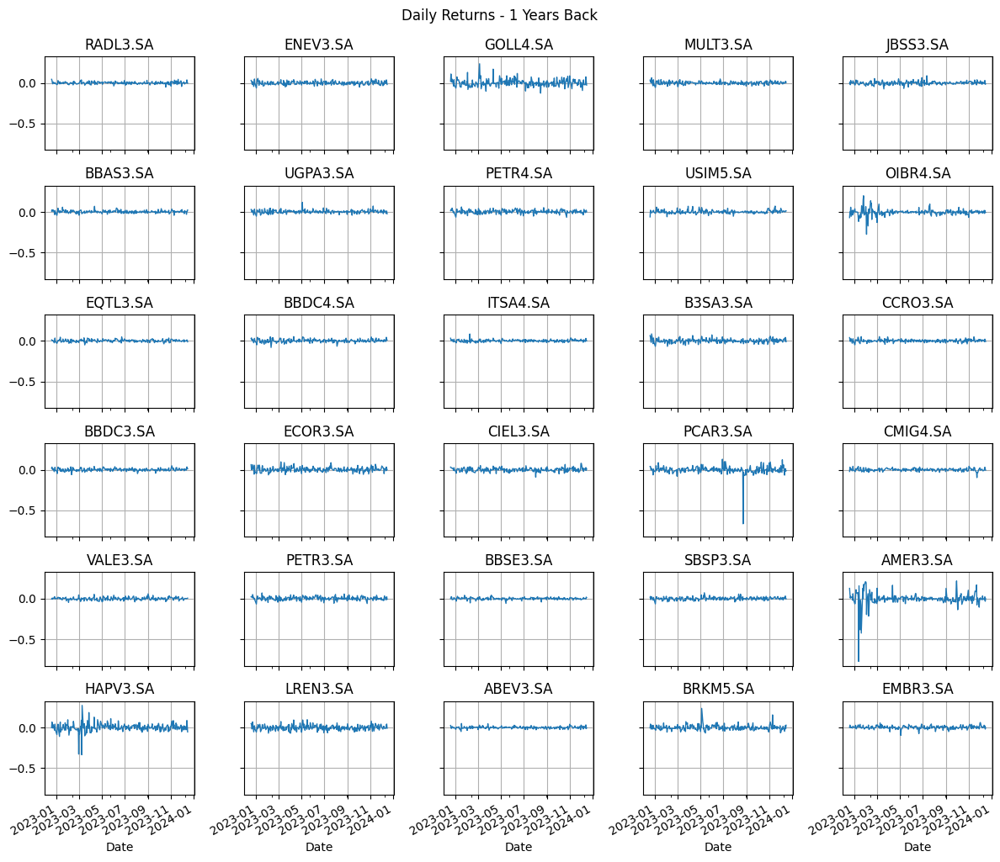

[*********************100%%**********************]  30 of 30 completed


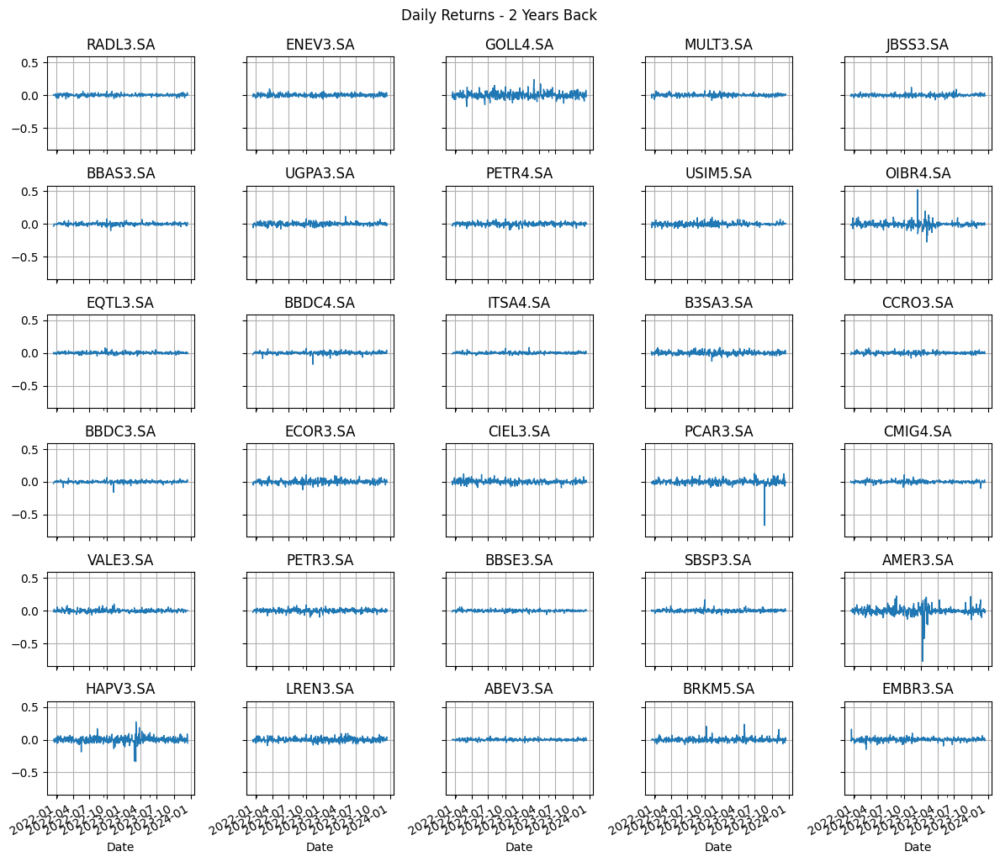

[*********************100%%**********************]  30 of 30 completed


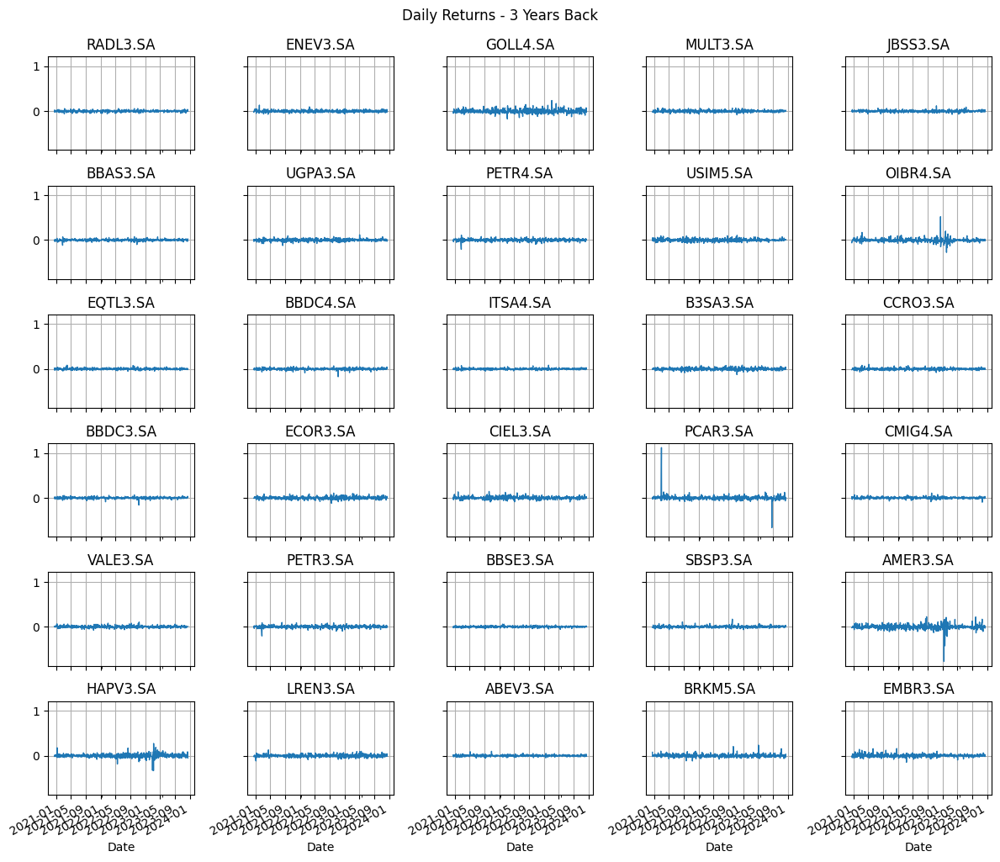

In [50]:
def plot_returns_n_years_back(tickers, num_years):
    # Obtém a data final
    end_date = pd.to_datetime('today')

    # Calcula a data inicial recuando o número de anos
    start_date = end_date - pd.DateOffset(years=num_years)

    # Baixa os dados usando yfinance
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]

    # Calcula os retornos diários
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]

    # Cria o subplot
    fig, ax = plt.subplots(6, 5, figsize=(12, 10), sharex=True, sharey=True)

    # Plota os gráficos
    for a, s in zip(ax.flatten(), tickers):
        daily_returns[s].plot(ax=a, lw=1, title=s, grid=True)

    plt.tight_layout()
    plt.suptitle(f'Daily Returns - {num_years} Years Back', y=1.02)
    plt.show()

plot_returns_n_years_back(tickers, num_years=1)
plot_returns_n_years_back(tickers, num_years=2)
plot_returns_n_years_back(tickers, num_years=3)

Percebe-se que, apesar de poucos casos que houve uma variação pontual de queda muito grande em relação ao retorno diário, como no caso das Americanas (AMER3.SA) e do Grupo Pão de Açucar (PCAR3.SA) as ações tendem a se manter bastante estáveis.

**Parte 1.c.** Criação do gráfico de distribuição de retornos do príodo de 1 ano, 2 anos e 3 anos.

[*********************100%%**********************]  30 of 30 completed


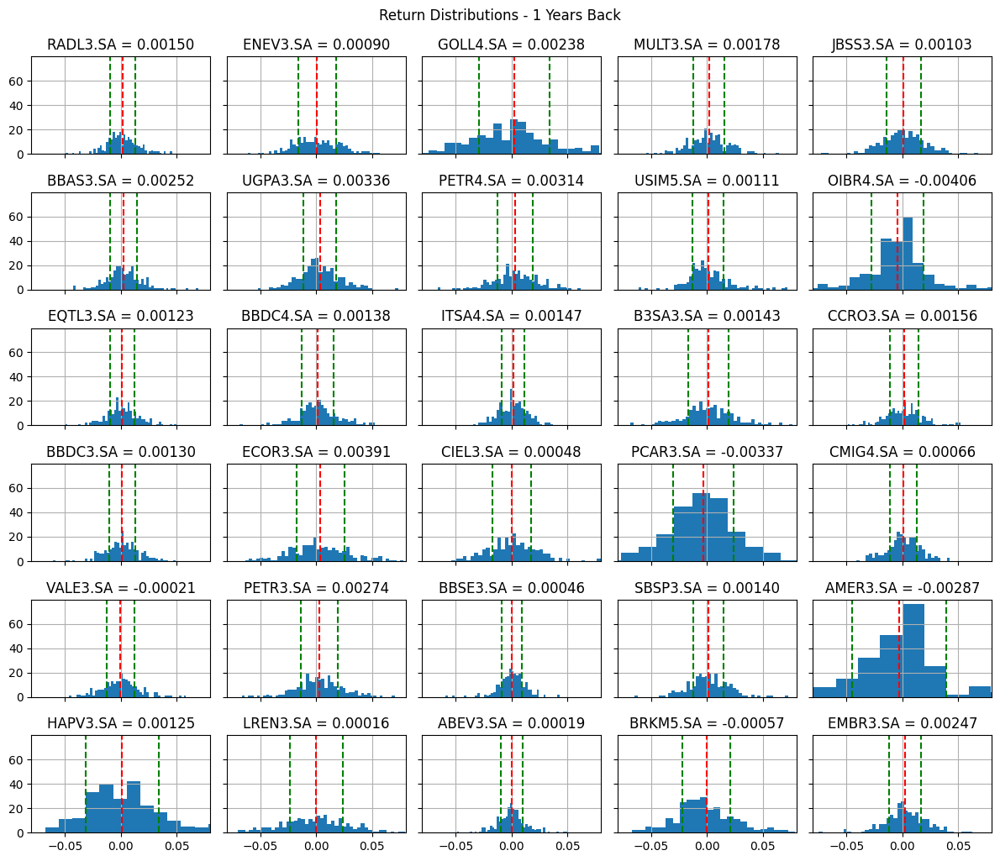

[*********************100%%**********************]  30 of 30 completed


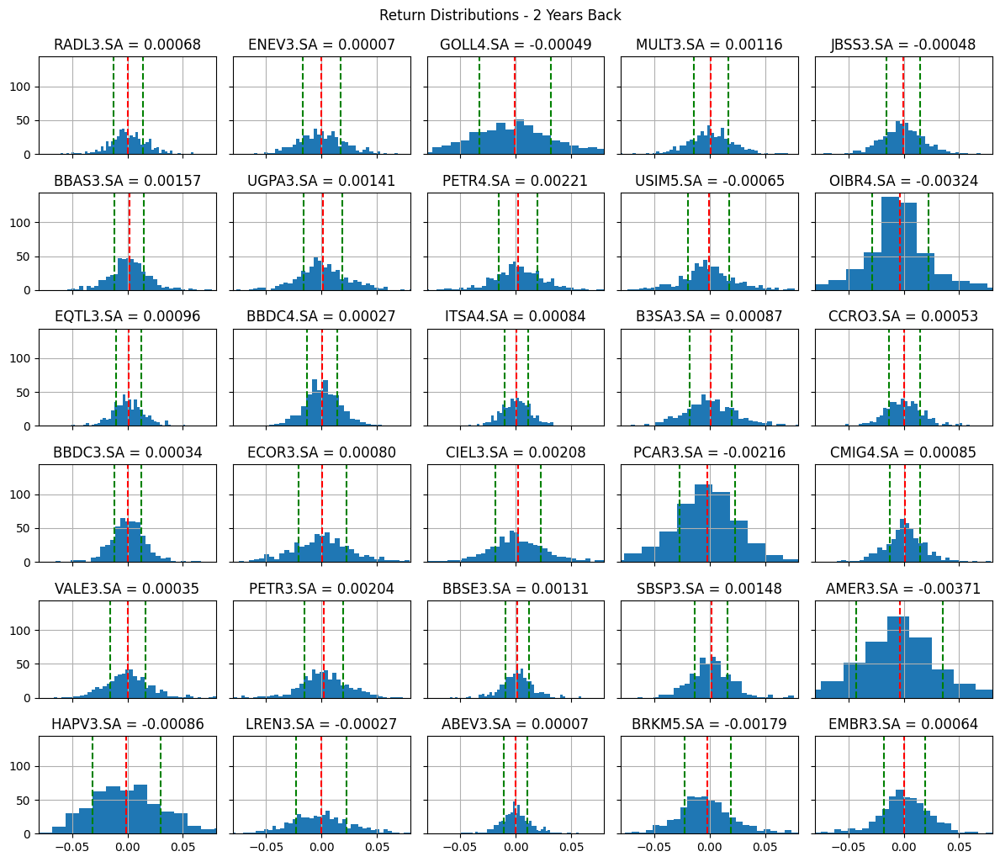

[*********************100%%**********************]  30 of 30 completed


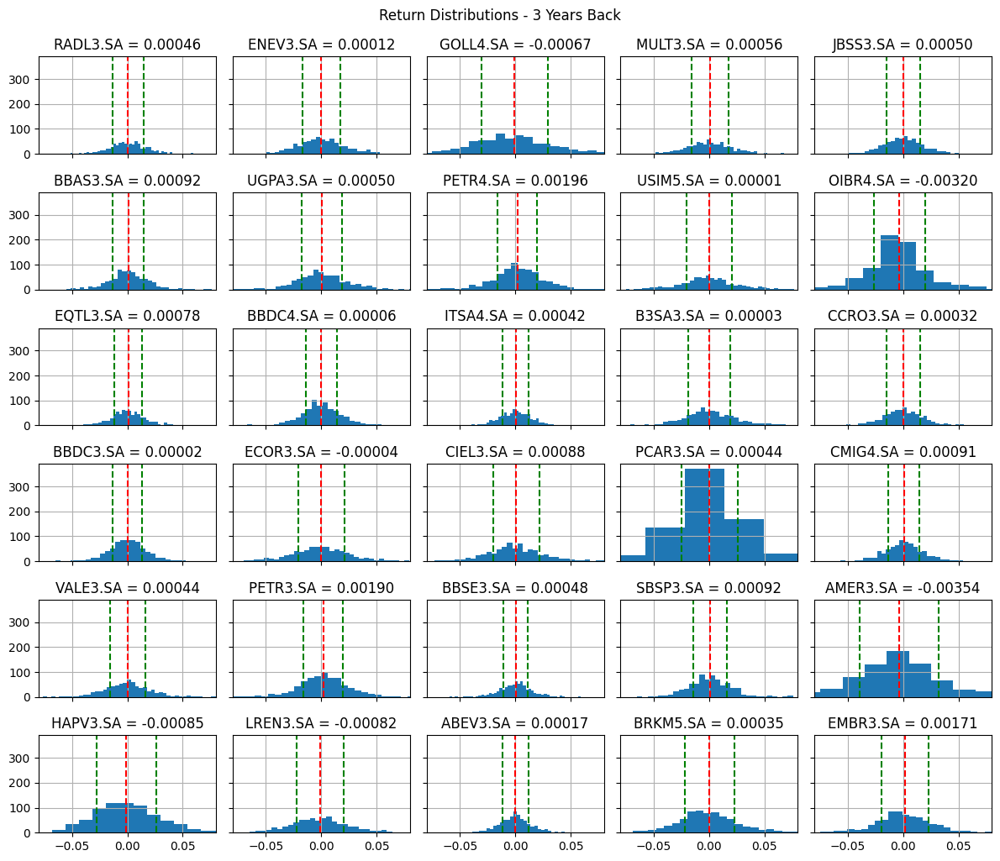

In [49]:
def plot_return_distributions_n_years_back(tickers, num_years):
    # Obtém a data final
    end_date = pd.to_datetime('today')

    # Calcula a data inicial recuando o número de anos
    start_date = end_date - pd.DateOffset(years=num_years)

    # Baixa os dados usando yfinance
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]

    # Calcula os retornos diários
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]

    # Cria o subplot
    fig, ax = plt.subplots(6, 5, figsize=(12, 10), sharex=True, sharey=True)
    ax = ax.flatten()

    # Plota os histogramas e linhas de referência
    for a, s in zip(ax.flatten(), tickers):
        daily_returns[s].hist(ax=a, lw=1, grid=True, bins=50)
        mean_return = daily_returns[s].mean()
        mean_absolute_deviation = abs((daily_returns[s] - mean_return)).mean()
        a.set_title(f"{s} = {mean_return:0.5f}")
        a.set_xlim(-0.08, 0.08)
        a.axvline(mean_return, color="r", linestyle="--")
        a.axvline(mean_return + mean_absolute_deviation, color="g", linestyle="--")
        a.axvline(mean_return - mean_absolute_deviation, color="g", linestyle="--")

    plt.tight_layout()
    plt.suptitle(f'Return Distributions - {num_years} Years Back', y=1.02)
    plt.show()

plot_return_distributions_n_years_back(tickers, num_years=1)
plot_return_distributions_n_years_back(tickers, num_years=2)
plot_return_distributions_n_years_back(tickers, num_years=3)


Assim como nos gráficos do tópico acima, neste é vísivel que para cada ação, apesar de anos diferentes, os resultados são bem similares, justamente por conta desta estabilidade presente no mercado, assim como já citado anteriormente.

 A maior diferença encontrada está justamente no PCAR3.SA, isto porque se considerando anos mais recentes, como 1 e 2 anos, houve um baixa muito grande, em um período específico, abaixando consequentemente os indicadores de retorno, porém, ao avaliar com 3 anos, como está incluso um perído de alta da ação, ambos acabam se compensando e afetando o indicador, elevando a sua nota na distribuição.

**Parte 1.d** Gráfico mostrando a média de retorno e média de desvio absoluto nos retornos nos períodos de 1 ano, 2 anos e 3 anos.

[*********************100%%**********************]  30 of 30 completed


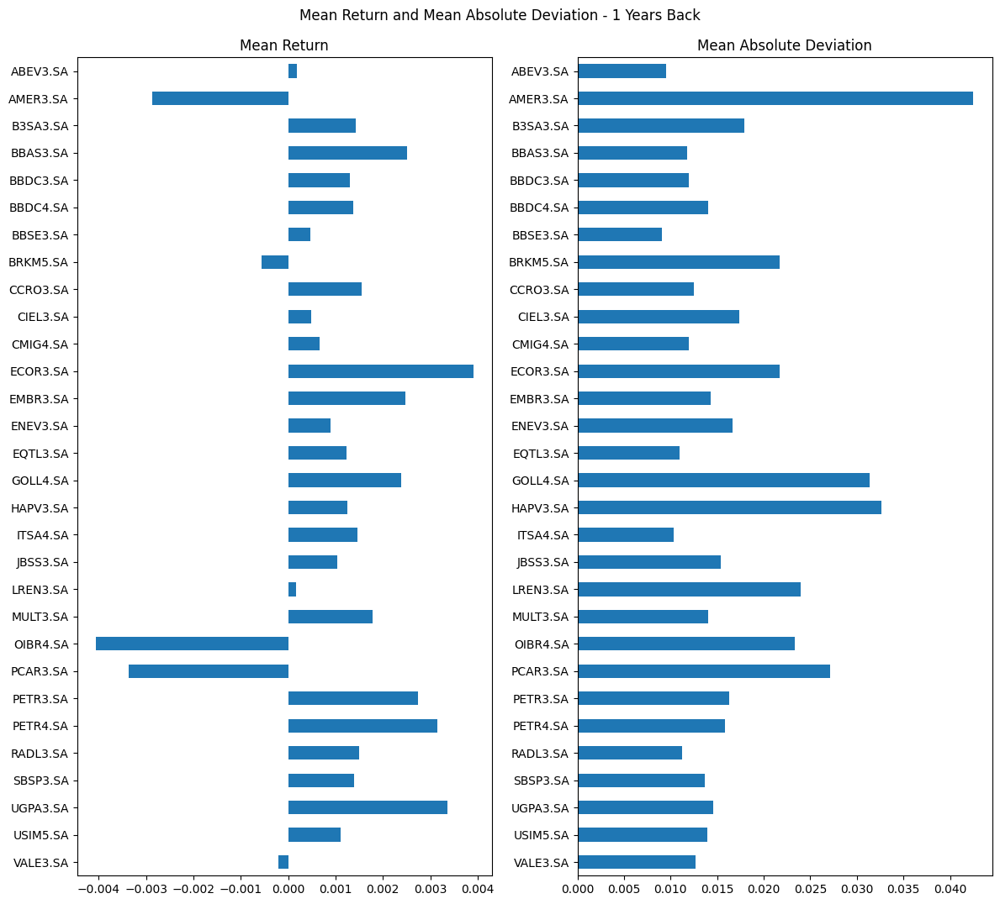

[*********************100%%**********************]  30 of 30 completed


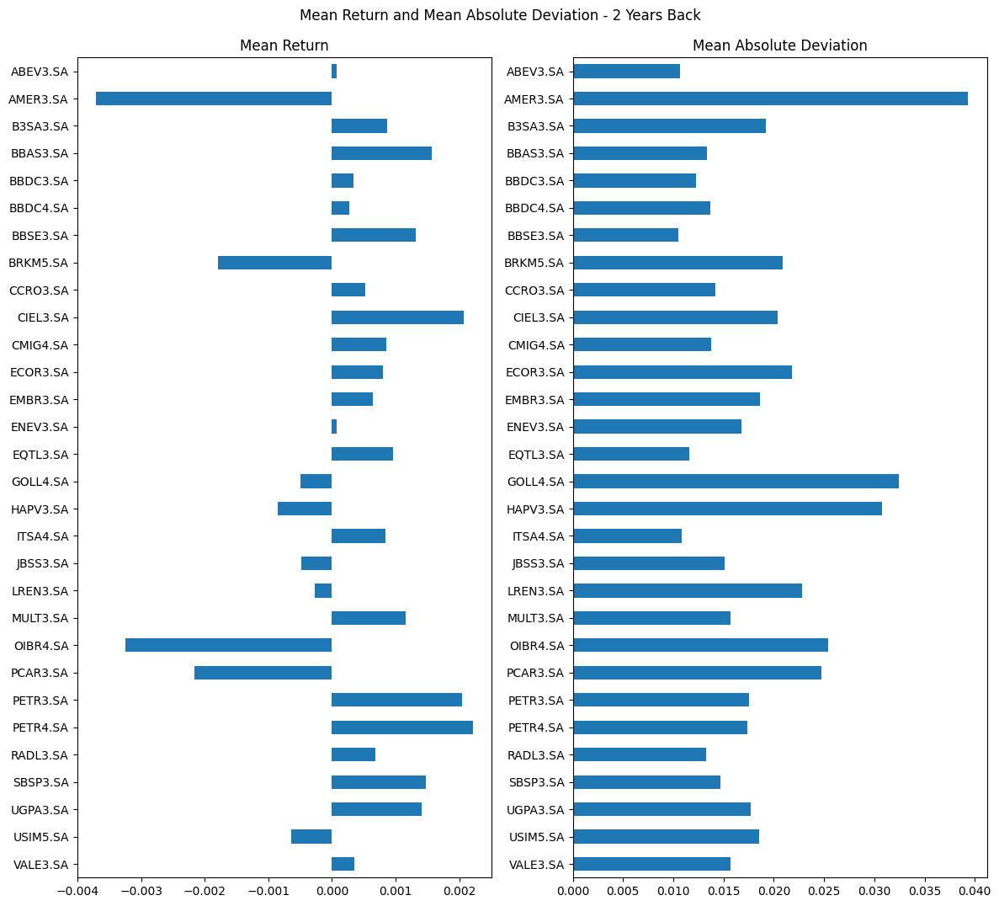

[*********************100%%**********************]  30 of 30 completed


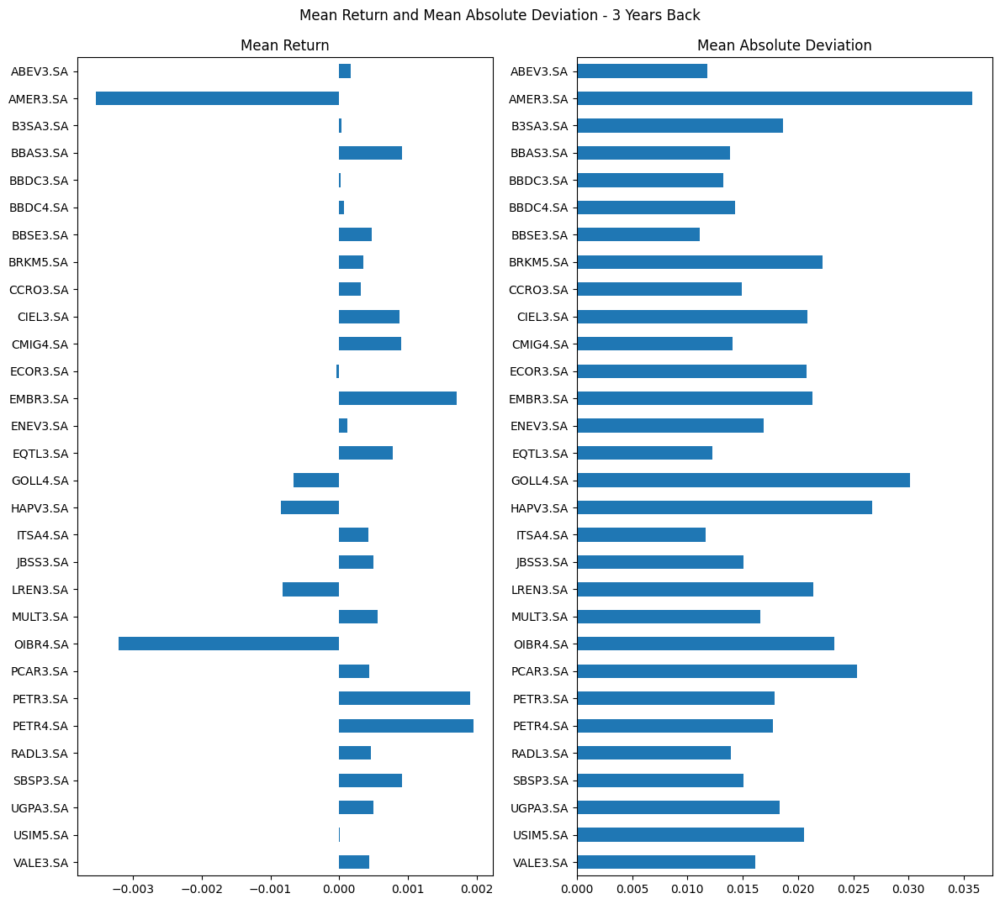

In [48]:
import yfinance as yf
import matplotlib.pyplot as plt
import pandas as pd

def plot_mean_return_deviation_n_years_back(tickers, num_years):
    # Obtém a data final
    end_date = pd.to_datetime('today')

    # Calcula a data inicial recuando o número de anos
    start_date = end_date - pd.DateOffset(years=num_years)

    # Baixa os dados usando yfinance
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]

    # Calcula os retornos diários
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]

    # Calcula o Mean Return e Mean Absolute Deviation
    mean_return = daily_returns.mean()
    mean_absolute_deviation = abs(daily_returns - mean_return).mean()

    # Cria o subplot
    fig, ax = plt.subplots(1, 2, figsize=(12, 0.35 * len(daily_returns.columns)))

    # Plota os gráficos de barras
    mean_return.plot(kind="barh", ax=ax[0], title="Mean Return")
    ax[0].invert_yaxis()

    mean_absolute_deviation.plot(kind="barh", ax=ax[1], title="Mean Absolute Deviation")
    ax[1].invert_yaxis()

    plt.tight_layout()
    plt.suptitle(f'Mean Return and Mean Absolute Deviation - {num_years} Years Back', y=1.02)
    plt.show()

plot_mean_return_deviation_n_years_back(tickers, num_years=1)
plot_mean_return_deviation_n_years_back(tickers, num_years=2)
plot_mean_return_deviation_n_years_back(tickers, num_years=3)

Nestes gráficos a conclusão se repete, apesar dos anos, o comportamento permanece parecido para grande parte das ações. Entretando, é interessante analisar que neste caso, aqueles retornos que se afastam muito da faixa do zero, normalmente representam também um desvio maior, mais especificamente para aqueles com retorno negativo.

Ademais, algo importante de se notar é que em geral, salvo as exceções já citadas, por se tratar de ações a faixa de desvio segue um mesmo padrão, ao qual se encontram muito próxima umas das outras. Os que se destacam com menor risco durante todo este período são as ações do Itaú e o Banco do Brasil, que como bancos, geralmente refletem em uma maior segurança.

**Parte 1.e** Gráfico de retorno vs risco nos períodos de 1 ano, 2 anos e 3 anos

[*********************100%%**********************]  30 of 30 completed


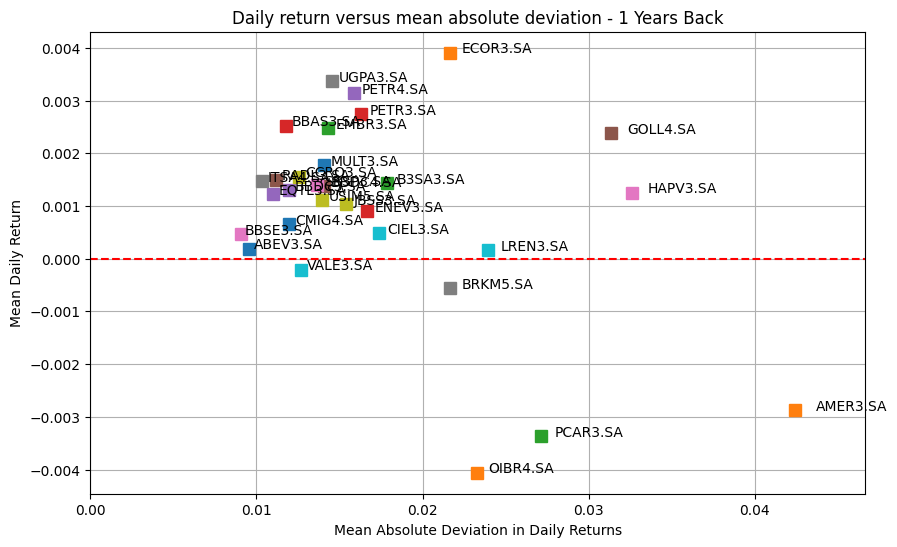

[*********************100%%**********************]  30 of 30 completed


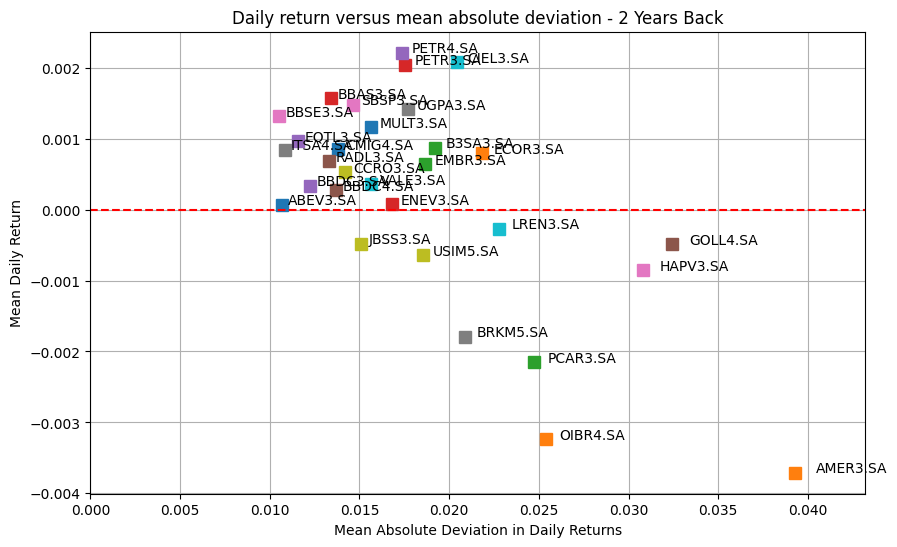

[*********************100%%**********************]  30 of 30 completed


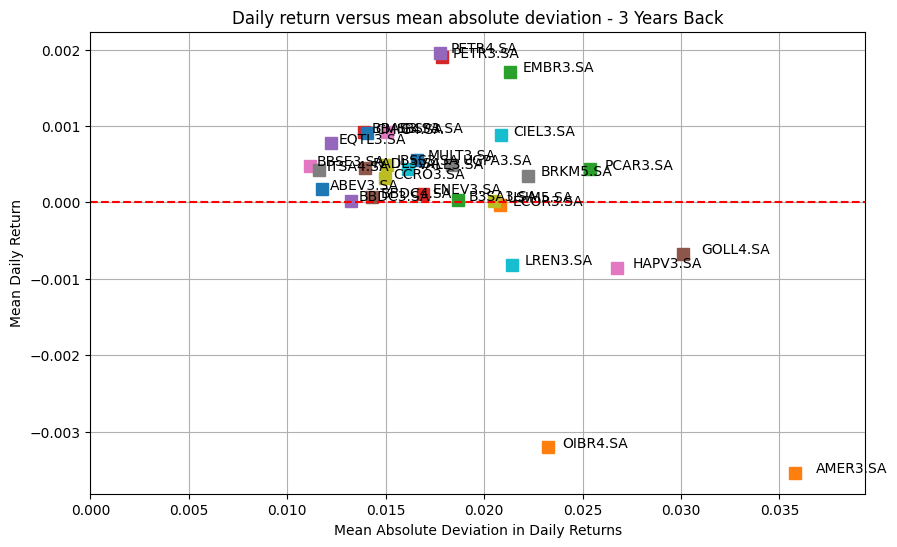

In [47]:
def plot_return_vs_risk_n_years_back(tickers, num_years):
    # Obtém a data final
    end_date = pd.to_datetime('today')

    # Calcula a data inicial recuando o número de anos
    start_date = end_date - pd.DateOffset(years=num_years)

    # Baixa os dados usando yfinance
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]

    # Calcula os retornos diários
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]

    # Calcula o Mean Return e Mean Absolute Deviation
    mean_return = daily_returns.mean()
    mean_absolute_deviation = abs(daily_returns - mean_return).mean()

    # Cria o subplot
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    # Plota o retorno versus risco para cada ativo
    for s in assets.keys():
        ax.plot(mean_absolute_deviation[s], mean_return[s], "s", ms=8)
        ax.text(mean_absolute_deviation[s] * 1.03, mean_return[s], s)

    ax.set_xlim(0, 1.1 * mean_absolute_deviation.max())
    ax.axhline(0, color="r", linestyle="--")
    ax.set_title(f"Daily return versus mean absolute deviation - {num_years} Years Back")
    ax.set_xlabel("Mean Absolute Deviation in Daily Returns")
    ax.set_ylabel("Mean Daily Return")
    ax.grid(True)

    plt.show()

plot_return_vs_risk_n_years_back(tickers, num_years=1)
plot_return_vs_risk_n_years_back(tickers, num_years=2)
plot_return_vs_risk_n_years_back(tickers, num_years=3)

Neste gráfico, as análises feitas acima ficam mais claras, é possível analisar que em grande parte, aquelas que touxeram retorno positivo representam um risco levemente menor. Já as ações que trouxeram retornos negativos, independente do ano, apresentaram um risco mais elevado.

**Parte 1.f** Otimização MAD (Modelo AMPL)

Os anos utilizados foram: 1 ano, 2 anos e 3 anos.

Os valores mínimos utilizados foram: 0.00, 0.01 e 0.012

In [5]:
%%writefile mad_portfolio.mod

param R default 0;
param w_lb default 0;
param w_ub default 1;

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;

minimize MAD: sum{t in TIME}(u[t] + v[t]) / card(TIME);

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

s.t. no_short {j in ASSETS}: w[j] >= w_lb;

s.t. diversify {j in ASSETS}: w[j] <= w_ub;

Writing mad_portfolio.mod


[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006396236286
296 simplex iterations
0 barrier iterations
 
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested     1.000
Required portfolio daily return    0.00000
Portfolio mean daily return        0.00071
Portfolio mean absolute deviation  0.00640
[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006470123754
309 simplex iterations
0 barrier iterations
 
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested     1.000
Required portfolio daily return    0.00100
Portfolio mean daily return        0.00100
Portfolio mean absolute deviation  0.00647
[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS

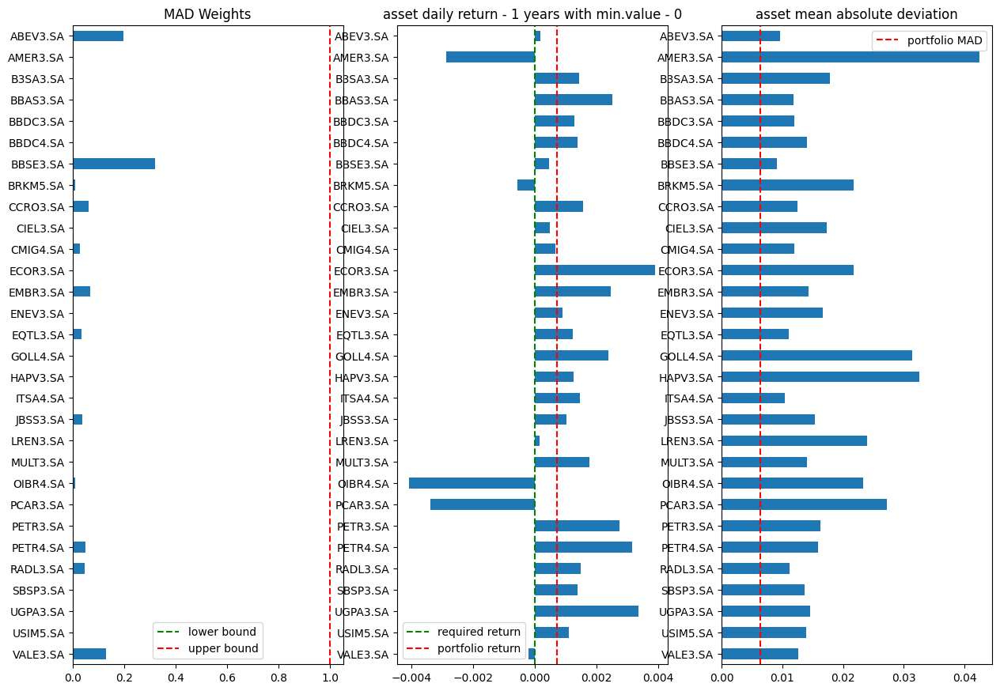

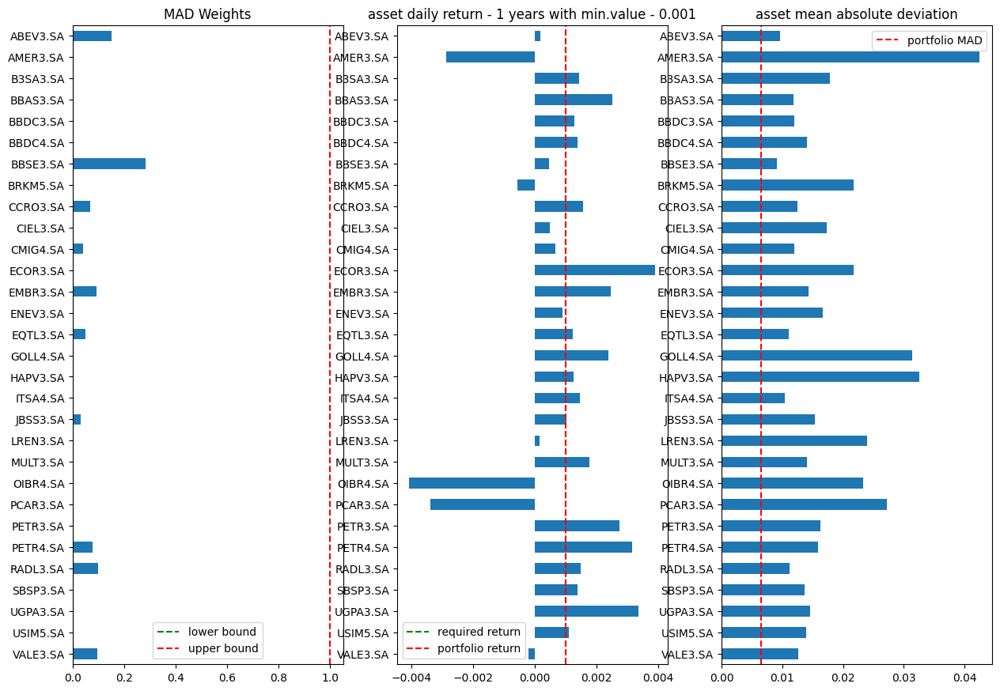

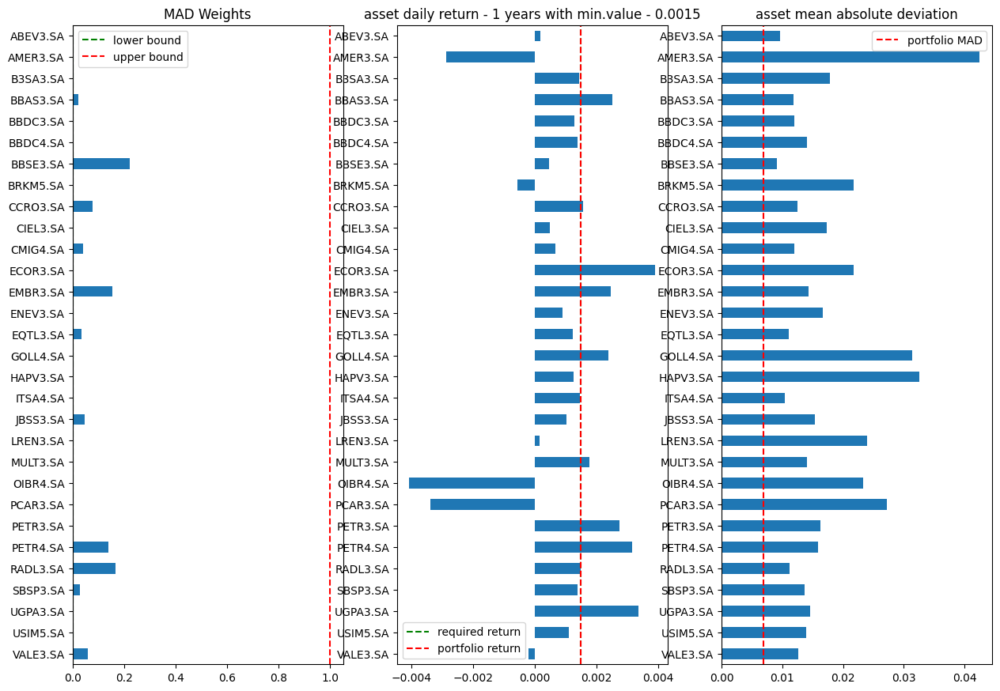

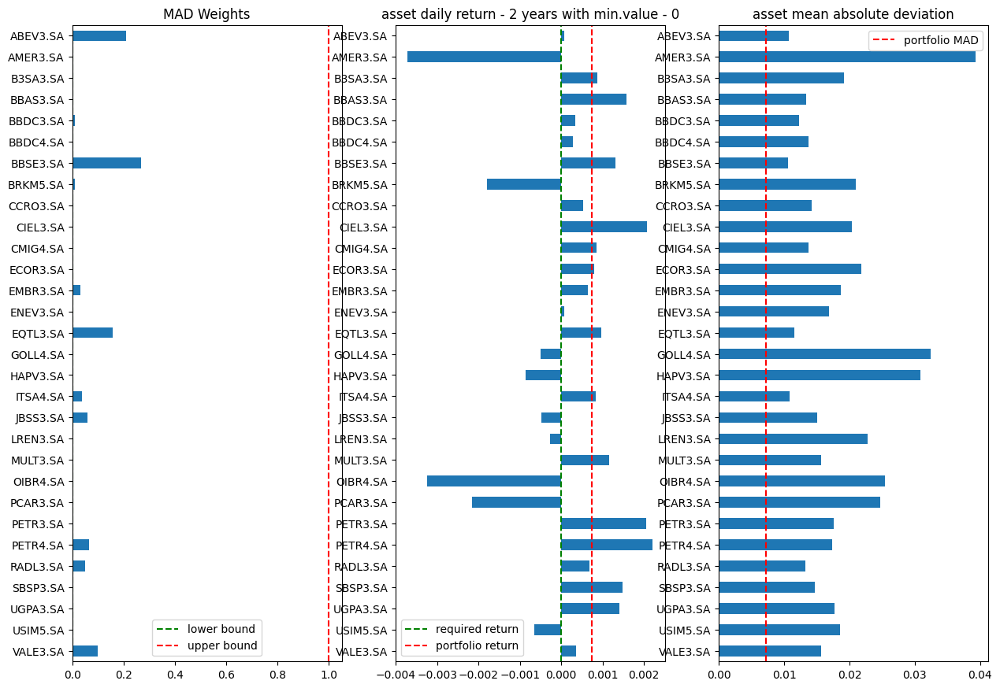

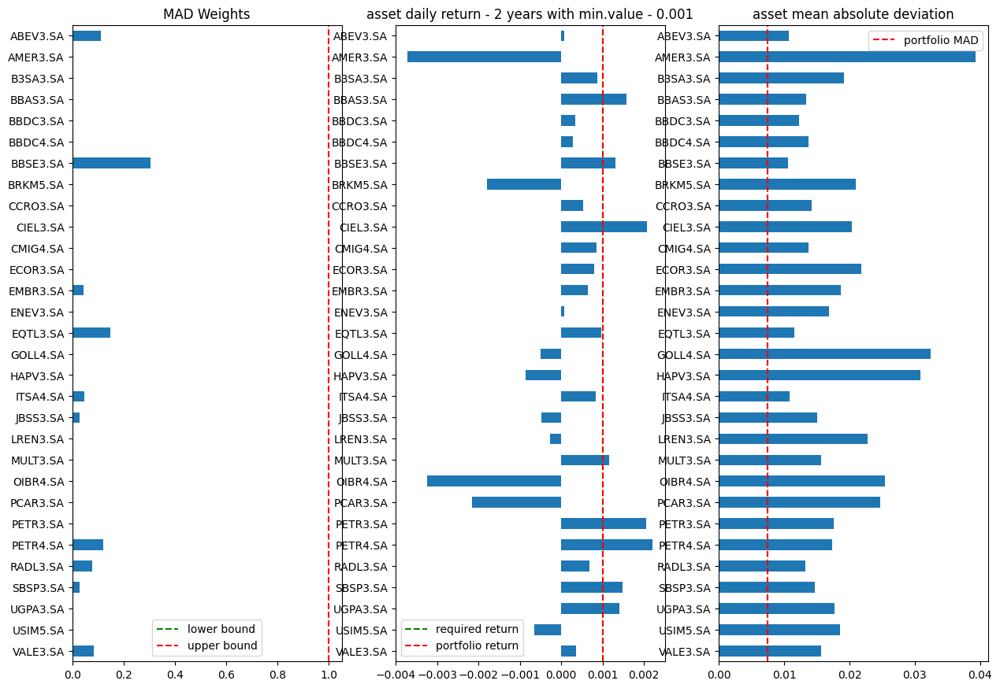

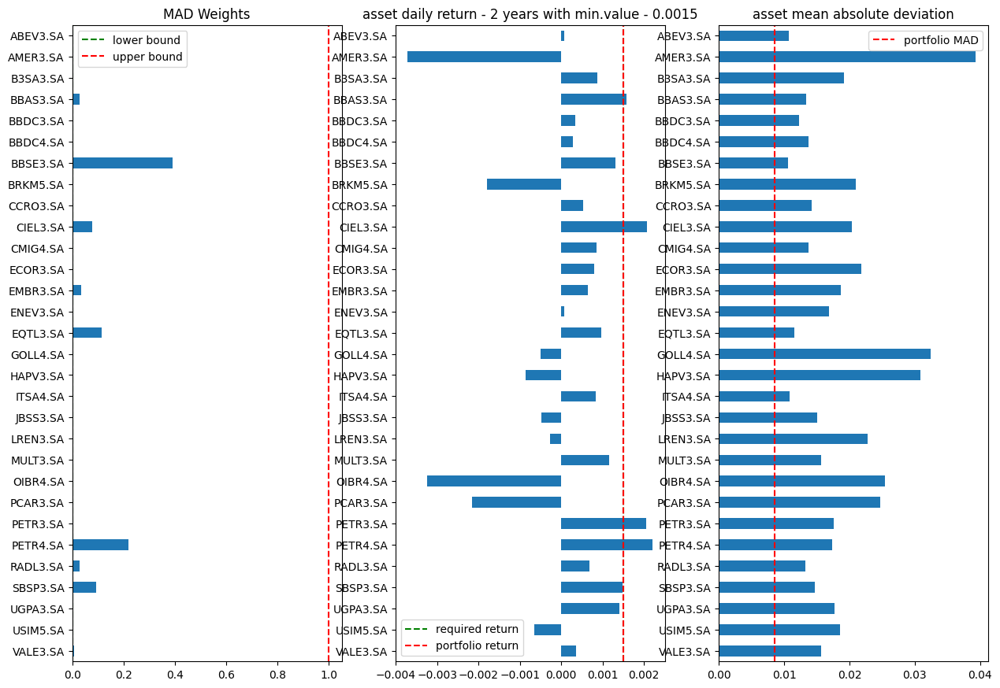

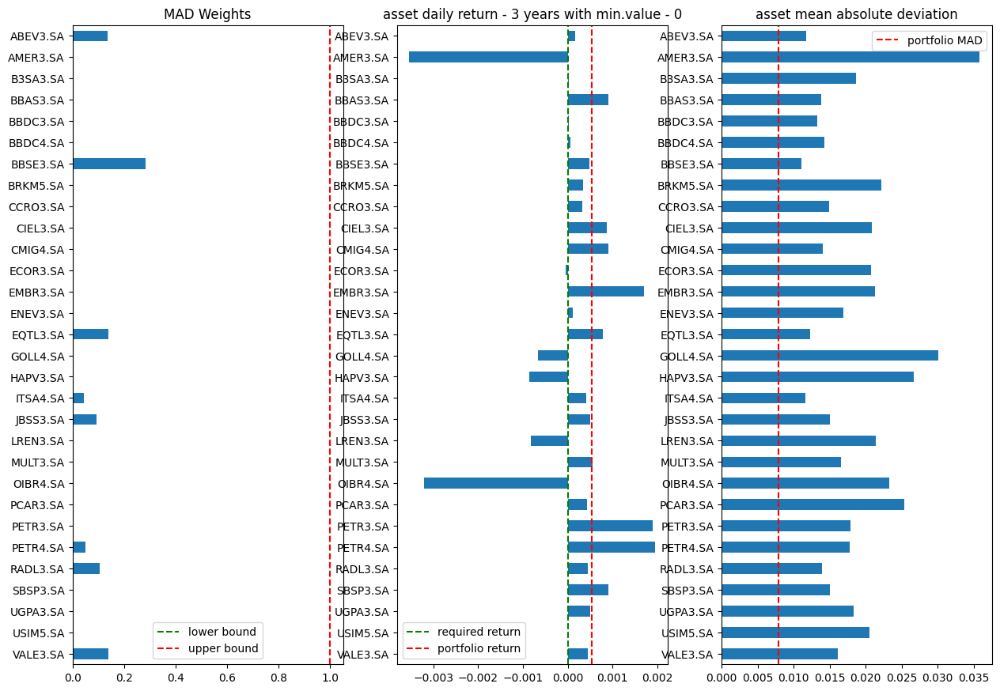

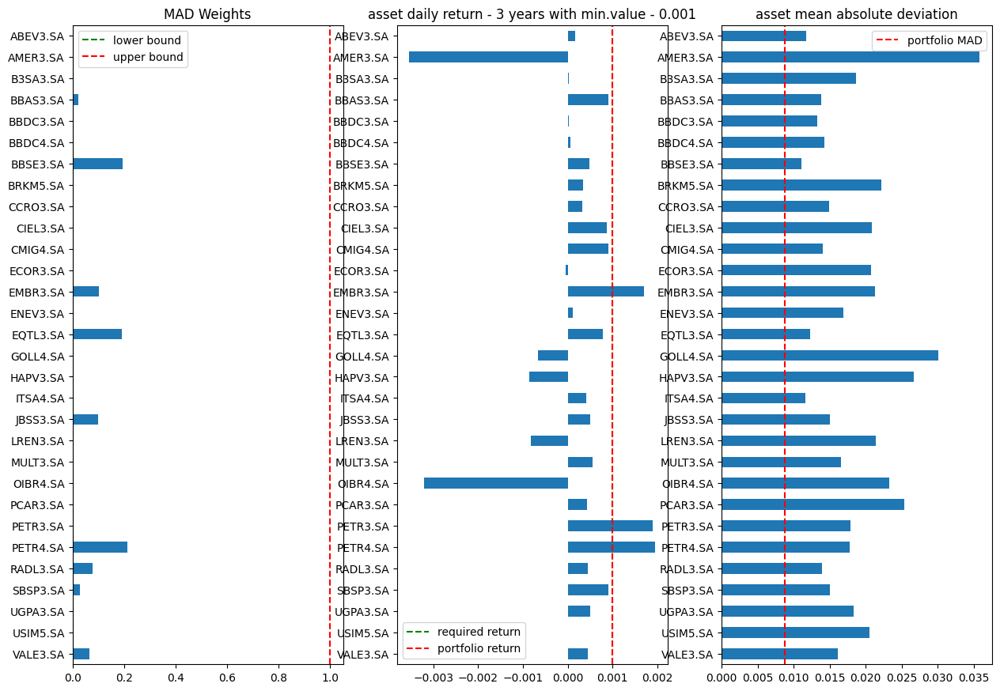

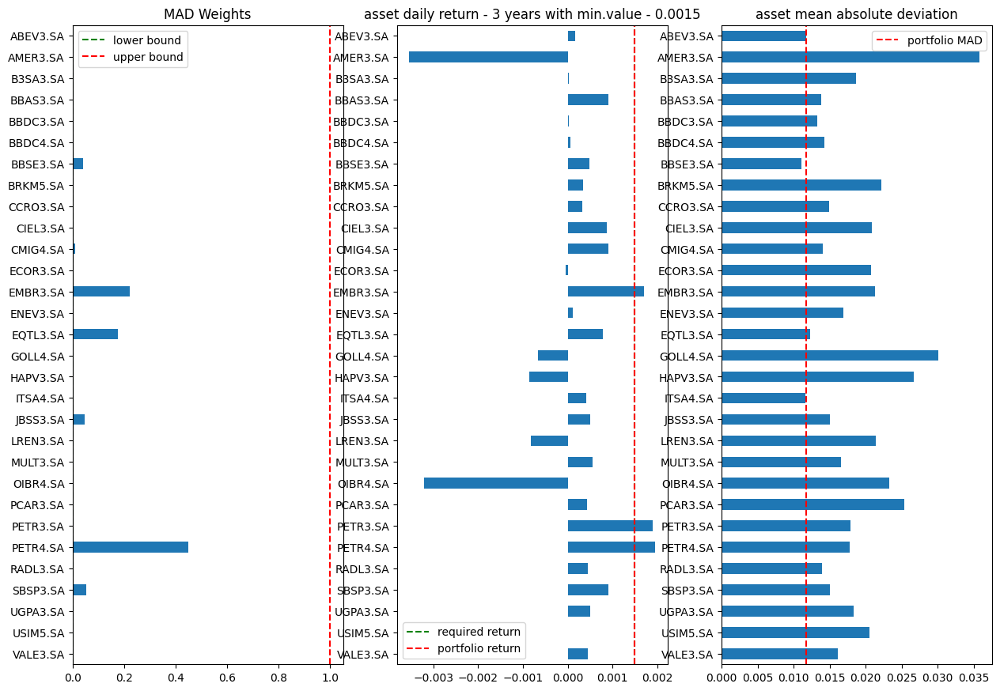

In [15]:
def mad_portfolio(assets, R):
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()

    daily_returns["Date"] = daily_returns.index.format()
    daily_returns.set_index("Date", inplace=True)

    ampl = AMPL()
    ampl.read("mad_portfolio.mod")

    ampl.set["ASSETS"] = list(assets.columns)
    ampl.set["TIME"] = daily_returns.index.values

    ampl.param["daily_returns"] = daily_returns
    ampl.param["mean_return"] = mean_return

    # Define R dentro do modelo
    ampl.param["R"] = R

    return ampl

def mad_visualization(assets, m, num_years):
    mean_portfolio_return = m.get_value("sum{j in ASSETS}(w[j] * mean_return[j])")

    print(f"Weight lower bound                {m.param['w_lb'].value():0.3f}")
    print(f"Weight upper bound                {m.param['w_ub'].value():0.3f}")
    print(
        f"Fraction of portfolio invested     {m.get_value('sum{j in ASSETS} w[j]'):0.3f}"
    )
    print(f"Required portfolio daily return    {m.param['R'].value():0.5f}")
    print(f"Portfolio mean daily return        {mean_portfolio_return:0.5f}")
    print(f"Portfolio mean absolute deviation  {m.obj['MAD'].value():0.5f}")

    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()
    mean_absolute_deviation = abs(daily_returns - mean_return).mean()
    mad_portfolio_weights = m.var["w"].to_pandas()

    fig, ax = plt.subplots(1, 3, figsize=(15, 0.35 * len(daily_returns.columns)))
    mad_portfolio_weights.plot(kind="barh", ax=ax[0], title=f"MAD Weights")
    ax[0].invert_yaxis()
    ax[0].axvline(m.param["w_lb"].value(), ls="--", color="g")
    ax[0].axvline(m.param["w_ub"].value(), ls="--", color="r")
    ax[0].legend(["lower bound", "upper bound"])

    mean_return.plot(kind="barh", ax=ax[1], title=f"asset daily return - {num_years} years with min.value - {m.param['R'].value()}")
    ax[1].axvline(m.param["R"].value(), ls="--", color="g")

    ax[1].axvline(mean_portfolio_return, ls="--", color="r")
    ax[1].invert_yaxis()
    ax[1].legend(["required return", "portfolio return"])

    mean_absolute_deviation.plot(
        kind="barh", ax=ax[2], title="asset mean absolute deviation"
    )
    ax[2].axvline(m.obj["MAD"].value(), ls="--", color="r")
    ax[2].legend(["portfolio MAD"])
    ax[2].invert_yaxis()

# Substitua os anos abaixo pelos anos desejados (1, 2, 3)
for num_years in [1, 2, 3]:
    # Substitua os valores abaixo pelos valores desejados (0.00, 0.001, 0.0015)
    for R_value in [0.00, 0.001, 0.0015]:
        # Baixa os dados usando yfinance
        assets = yf.download(tickers, start=pd.to_datetime('today') - pd.DateOffset(years=num_years), end=pd.to_datetime('today'))["Adj Close"]

        # Cria o modelo para os ativos e o valor de R
        m = mad_portfolio(assets, R=R_value)

        # Configura os parâmetros e resolve o modelo
        m.param["w_ub"] = 1
        m.param["w_lb"] = 0.00
        m.option["solver"] = SOLVER
        m.solve()

        # Visualiza os resultados
        mad_visualization(assets, m, num_years)

Ao aplicar o modelo MAD para diferentes anos (1 ano, 2 anos e 3 anos), com variação de valores mínimos fixados em 0.00, 0.001 e 0.0015, as variações ocorrem tanto referente ao mesmo ano com valores mínimos diferentes, quando para valores mínimos iguais porem com anos diferentes, apesar de não serem tão grotescas.

Em um geral, ao analisar o gráfico, percebe-se que a grande maioria foi fixada com peso no mínimo requerido, ou seja, 0. Isto porque, para o problema encontrado de chegar ao valor maior ou igual ao requerido de retorno, determinadas ações não precisam ter participação.

Com isto, a variação entre anos e valores mínimos requeridos se deu pela melhor forma de chegar ao valor esperado, ou maior que ele para o caso de retorno esperado = 0.00, equilibrado por um desvio aceitável.

Percebe-se nos gráficos, que em sua maioria, apesar do ano e do retorno mínimo, as ações do Banco do Brasil (BB), tiveram peso relevante.



**Parte 1.g** Gráfico para definição de peso das ações para diferentes valores mínimos (0.00, 0.01 e 0.012) e diferentes anos (1, 2 e 3)

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 1 anos:
Retorno esperado: 22.19%
Volatilidade esperada: 12.92%


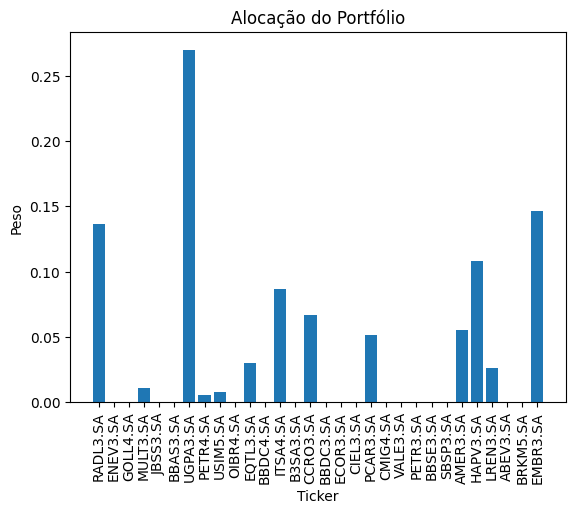


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 2 anos:
Retorno esperado: 18.29%
Volatilidade esperada: 14.78%


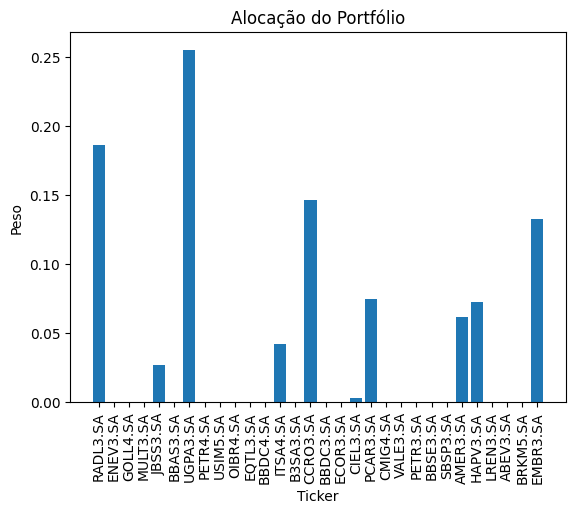


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 3 anos:
Retorno esperado: 12.91%
Volatilidade esperada: 15.97%


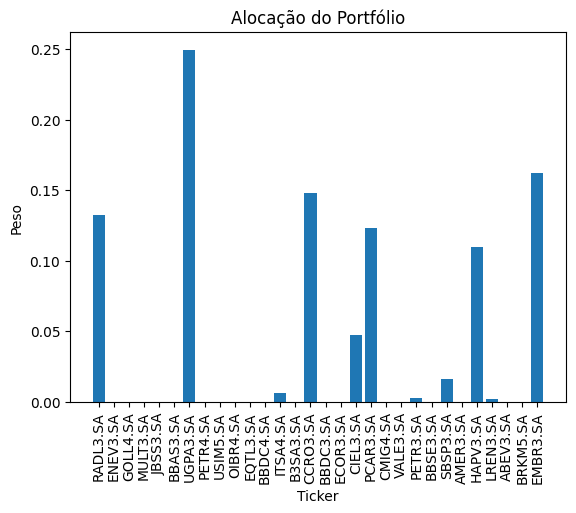

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 1 anos:
Retorno esperado: 22.19%
Volatilidade esperada: 12.92%


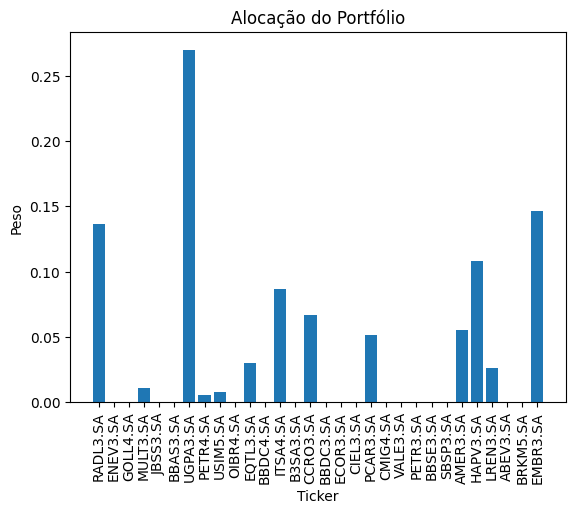


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 2 anos:
Retorno esperado: 18.29%
Volatilidade esperada: 14.78%


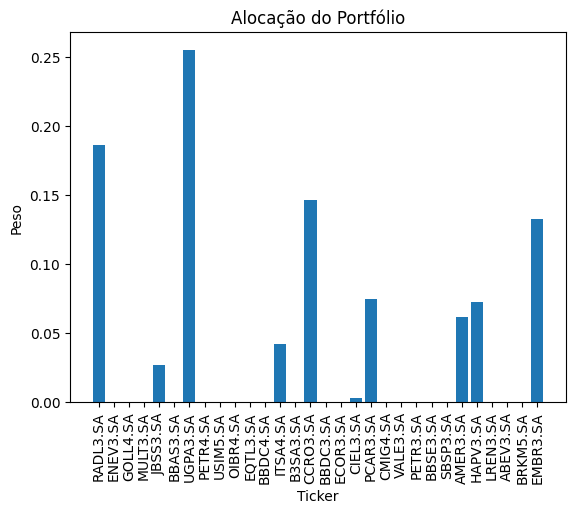


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 3 anos:
Retorno esperado: 12.91%
Volatilidade esperada: 15.97%


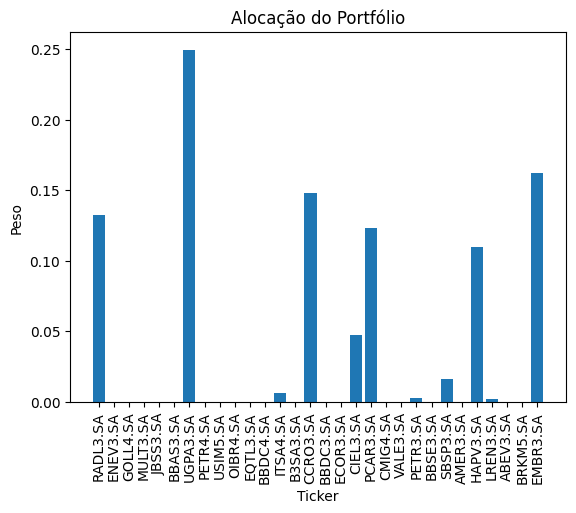

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 1 anos:
Retorno esperado: 22.19%
Volatilidade esperada: 12.92%


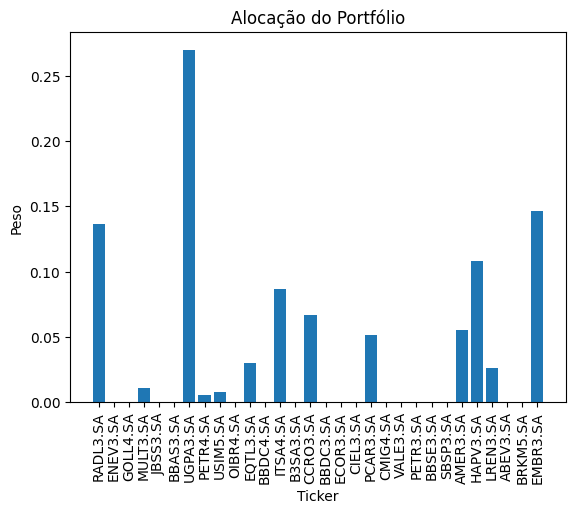


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 2 anos:
Retorno esperado: 18.29%
Volatilidade esperada: 14.78%


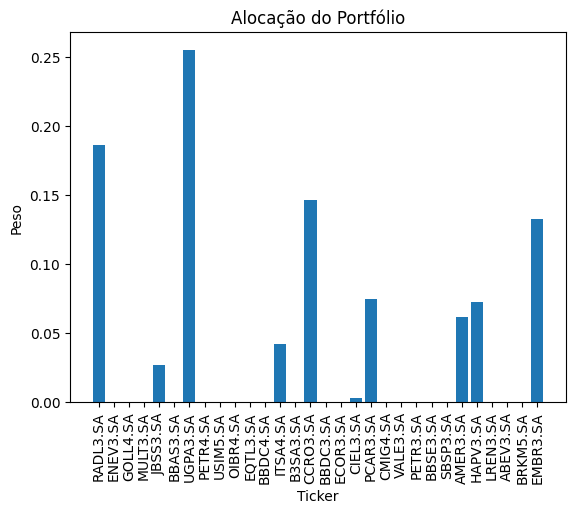


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 3 anos:
Retorno esperado: 12.91%
Volatilidade esperada: 15.97%


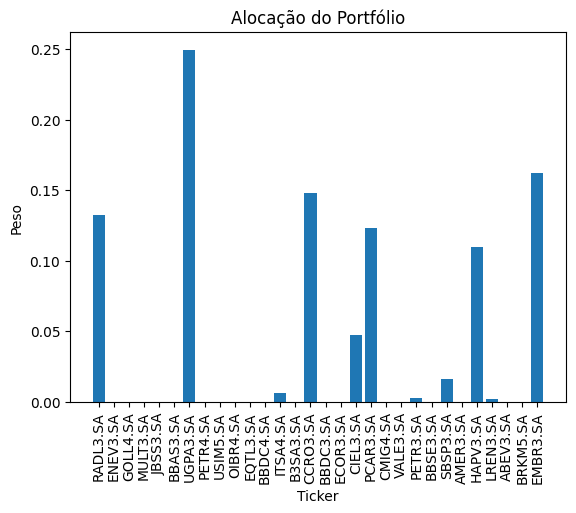

In [16]:
# Função para baixar dados históricos
def download_data(tickers, start_date, end_date):
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]
    assets.fillna(method="bfill", inplace=True)
    assets.fillna(method="ffill", inplace=True)
    return assets

# Função para calcular o retorno e volatilidade do portfólio
def calculate_portfolio_performance(weights, returns):
    portfolio_return = np.dot(weights, returns.mean()) * 252  # 252 dias úteis em um ano
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(returns.cov() * 252, weights)))
    return portfolio_return, portfolio_volatility

# Função de otimização
def optimize_portfolio(returns, min_return):
    num_assets = len(returns.columns)
    initial_weights = np.ones(num_assets) / num_assets  # Alocação igual inicial
    constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1})  # Restrição de alocação total igual a 1
    bounds = tuple((0, 1) for asset in range(num_assets))  # Limites de alocação entre 0 e 1

    # Minimizar a volatilidade sujeita a uma restrição de retorno mínimo
    optimal_weights = minimize(lambda weights: calculate_portfolio_performance(weights, returns)[1],
                               initial_weights, method='SLSQP',
                               bounds=bounds, constraints=constraints)['x']

    # Verificar se o retorno do portfólio otimizado atende ao requisito mínimo
    if calculate_portfolio_performance(optimal_weights, returns)[0] < min_return:
        print(f"Não foi possível atingir o retorno mínimo de {min_return:.2%}.")
        return None

    return optimal_weights

    if calculate_portfolio_performance(optimal_weights, returns)[0] < min_return:
        print(f"Não foi possível atingir o retorno mínimo de {min_return:.2%}.")
        return None

    return dict(zip(tickers, optimal_weights))  # Associar os pesos aos tickers das ações

# Configurar parâmetros
min_returns = [0.00, 0.01, 0.012]  # Exemplo de diferentes valores mínimos de retorno

# Loop sobre diferentes valores mínimos de retorno
for min_return in min_returns:
    # Baixar dados históricos
    assets = download_data(tickers, start_date, end_date)

    # Calcular retornos diários
    returns = assets.pct_change().dropna()

    # Loop sobre diferentes períodos de tempo
    for n_years in [1, 2, 3]:
        # Ajustar a janela de dados
        end_date = dt.datetime.today().date()
        start_date = end_date - dt.timedelta(round(n_years * 365))
        returns_window = returns.loc[start_date:end_date]

        # Otimizar o portfólio
        weights = optimize_portfolio(returns_window, min_return)

        if weights is not None:
            # Calcular e imprimir o retorno e volatilidade do portfólio otimizado
            portfolio_return, portfolio_volatility = calculate_portfolio_performance(weights, returns_window)
            print(f"\nPortfólio otimizado para um retorno mínimo de {min_return:.2%} "
                  f"nos últimos {n_years} anos:")
            print(f"Retorno esperado: {portfolio_return:.2%}")
            print(f"Volatilidade esperada: {portfolio_volatility:.2%}")

            # Plotar a alocação do portfólio
            plt.bar(tickers, weights)
            plt.title("Alocação do Portfólio")
            plt.xlabel("Ticker")
            plt.ylabel("Peso")
            plt.xticks(rotation=90)
            plt.show()


Nestes gráficos acima, tem-se a mesma proposta do MAD, porém com uma abordagem diferente. Ao invés de mostrar o risco individual de cada ação, assim como o reotorno esperado. Ele unifica para evidenviar o do portfólio todo.

Neste contexto, é perceptível que mesmo com valores mínimos de retorno diferentes e também anos diferentes, as ações que possuem maior peso (BBAS3, RADL3, EMBR3 e ITSA4) permaneceu com uma variação de peso muito parecida.

Também é importante notar que as variações ocorreram apenas dentro de um mesmo valor mínimo, com alteração apenas dos anos. A partir dos resultados:
* 1 ano: Retorno esperado: 22.19% e Volatilidade esperada: 12.92%
* 2 anos: Retorno esperado: 18.29% e Volatilidade esperada: 14.78%
* 3 anos: Retorno esperado: 12.91% e Volatilidade esperada: 15.97%

Percebe-se que o retorno esperado e a volatilidade esperada possuem melhores valores a medida em que se olha um tempo menor. Ou seja, quanto maior o tempo analisado para cada ação, menor o retorno e maior o risco, o que pode representar de certo modo, maior fidelidade e segurança em um cenário real quando se comparado com um tempo menor.

Logo, baseado nos resultados obtidos é possível considerar que durante os três anos, as ações com maior peso se manteram muito estáveis, com poucas variações e com um retorno adequado para a otimização desejada. Isso explicaria a razão pelos quais ela está presente em grande peso independente do valor mínimo aplicado e da quantidade de anos de referência.

As demais ações que para cada valor mínimo teve maior ou menor participação, representa, analogamente, ações com maior volatilidade a cada ano. Ou seja, são ações que não se manteram constantes, e que por um período definido de tempo estiveram em alta ou baixa. Sendo mais vantajoso a utilização de determinadas ações para cada período.

Por fim, um ponto importante de ser analisado é que mesmo com a diferença entre valores mínimos, os resultados de volatilidade e resultado esperado para cada ano se manteve igual. Uma das razões pelos quais isto pode ter acontecido é que a restrição de retorno mínimo pode ser muito flexível, permitindo que o otimizador escolha portfólios com retornos superiores ao mínimo especificado sem comprometer muito a volatilidade. Outra razão pode ser exatamente pelas condições do mercado, em que podem ser relativamente estáveis ou seguir padrões que não alteram significativamente a alocação otimizada para diferentes cenários.

**Parte 1.h** Gráfico MAD: risco vs retorno

[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006396236554
312 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006396236554
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006396236554
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006396236554
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006404811208
14 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006483743047
22 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006616096268
8 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: opti

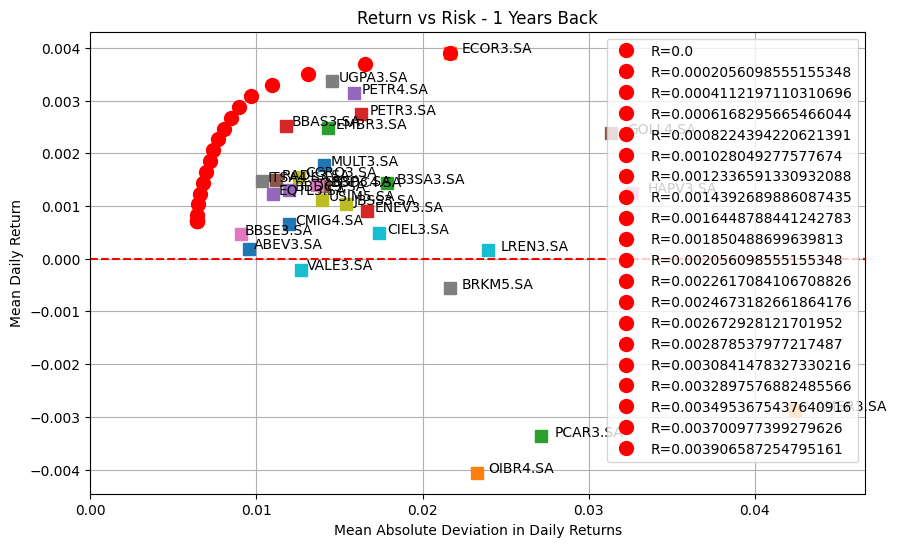

[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
601 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007273908064
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optima

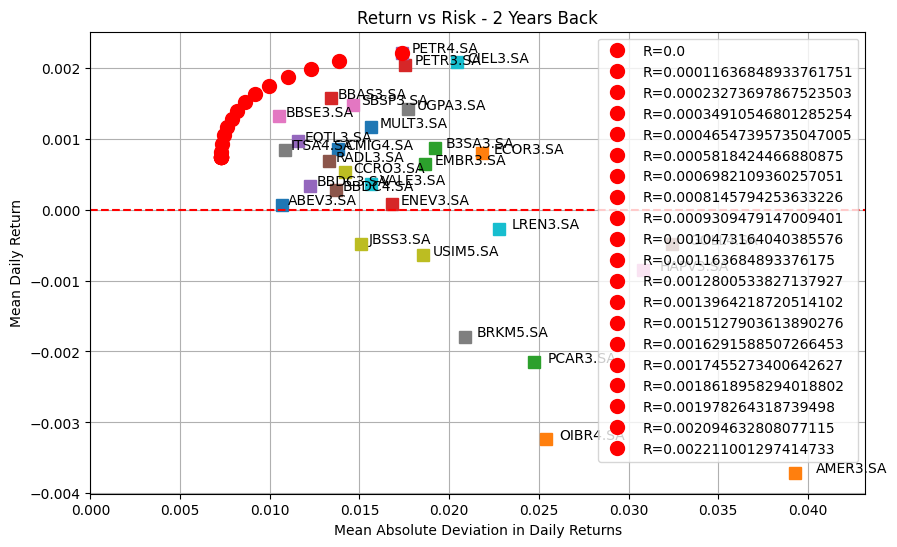

[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007939354039
877 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007939354039
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007939354039
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007939354039
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007939354039
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007939354039
0 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.007972203958
38 simplex iterations
0 barrier iterations
 
HiGHS 1.6.0: HiGHS 1.6.0: optim

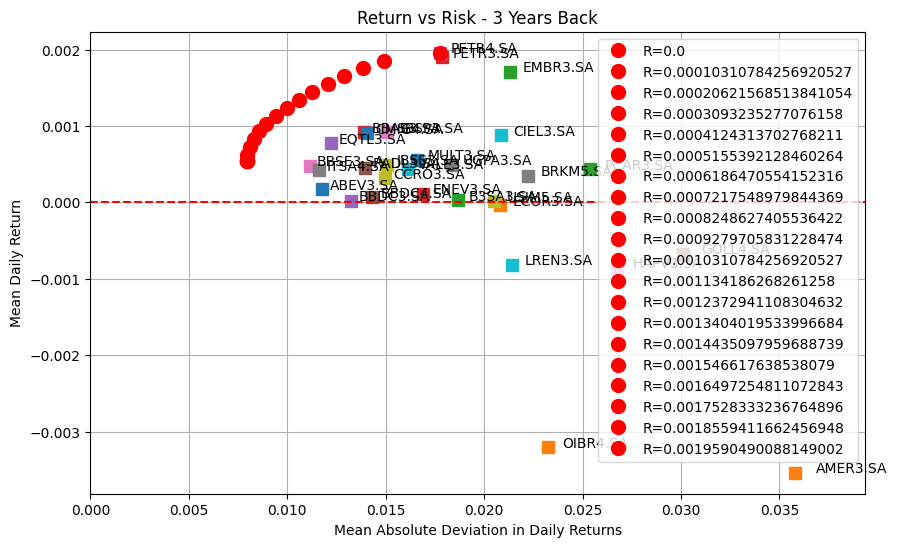

In [46]:
def mad_portfolio_risk(assets):
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()

    daily_returns["Date"] = daily_returns.index.format()
    daily_returns.set_index("Date", inplace=True)

    ampl = AMPL()
    ampl.read("mad_portfolio.mod")

    ampl.set["ASSETS"] = list(assets.columns)
    ampl.set["TIME"] = daily_returns.index.values

    ampl.param["daily_returns"] = daily_returns
    ampl.param["mean_return"] = mean_return

    return ampl

for num_years in [1, 2, 3]:
    # Baixa os dados usando yfinance
    start_date = pd.to_datetime('today') - pd.DateOffset(years=num_years)
    end_date = pd.to_datetime('today')
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]

    # Calcula os retornos diários
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()
    mean_absolute_deviation = abs(daily_returns - mean_return).mean()

    # Cria o subplot
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    # Plota o retorno versus risco para cada ativo
    for s in assets.keys():
        ax.plot(mean_absolute_deviation[s], mean_return[s], "s", ms=8)
        ax.text(mean_absolute_deviation[s] * 1.03, mean_return[s], s)

    ax.set_xlim(0, 1.1 * max(mean_absolute_deviation))
    ax.axhline(0, color="r", linestyle="--")
    ax.set_title(f"Return vs Risk - {num_years} Years Back")
    ax.set_xlabel("Mean Absolute Deviation in Daily Returns")
    ax.set_ylabel("Mean Daily Return")
    ax.grid(True)

    # Cria um objeto mad_portfolio para os ativos
    m = mad_portfolio_risk(assets)

    # Loop para diferentes valores de R
    for R in np.linspace(0, mean_return.max(), 20):
        m.param["R"] = R
        m.option["solver"] = SOLVER
        m.solve()
        mad_portfolio_weights = m.var["w"].to_pandas()
        portfolio_returns = daily_returns.dot(mad_portfolio_weights)
        portfolio_mean_return = portfolio_returns.mean()
        portfolio_mean_absolute_deviation = abs(portfolio_returns - portfolio_mean_return).mean()
        ax.plot(portfolio_mean_absolute_deviation, portfolio_mean_return, "ro", ms=10, label=f"R={R}")

    ax.legend()
    plt.show()

O gráfico acima, é muito parecido com o expresso anteriormente, a maior diferença se concentra na exibição dos diferentes valores de retorno para os três anos.

Como já visto nos demais itens, em um geral, apesar de anos serem diferentes, o resultado também é muito próximo, apenas um detalhe interessante de se analisar é que a medida que se olha para uma menor quantidade de anos, observa-se um estreitamento dos retornos. Ou seja, comparando 1 ano com o de 3 anos, vê-se que em um ano o retorno é maior com menos risco, enquanto para três anos o retorno é menor com maior risco. Isto corrobora exatamente com o que foi exposto logo no item acima, quando analisado o retorno e a volatilidade para o conjunto total de ações.

### 2. Para os cenários acima (escolhidos por você), varie os limitantes superiores que induzem diversificação; uma das variantes não deve ter condições de diversificação nenhuma. Reporte diferenças significativas, caso existam.

In [ ]:
%%writefile mad_portfolio_1.mod

param R default 0;
param w_lb default 0;
param w_ub default 0.1;

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;

minimize MAD: sum{t in TIME}(u[t] + v[t]) / card(TIME);

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

s.t. no_short {j in ASSETS}: w[j] >= w_lb;

s.t. diversify {j in ASSETS}: w[j] <= w_ub;

Overwriting mad_portfolio_1.mod


In [ ]:
%%writefile mad_portfolio_2.mod

param R default 0;
param w_lb default 0;
param w_ub default 0.5;

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;

minimize MAD: sum{t in TIME}(u[t] + v[t]) / card(TIME);

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

s.t. no_short {j in ASSETS}: w[j] >= w_lb;

s.t. diversify {j in ASSETS}: w[j] <= w_ub;

Overwriting mad_portfolio_2.mod


In [ ]:
%%writefile mad_portfolio_3.mod

param R default 0;
param w_lb default 0;
param w_ub default 1;

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;

minimize MAD: sum{t in TIME}(u[t] + v[t]) / card(TIME);

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

s.t. no_short {j in ASSETS}: w[j] >= w_lb;

s.t. diversify {j in ASSETS}: w[j] <= w_ub;

Overwriting mad_portfolio_3.mod


In [ ]:
%%writefile mad_portfolio_4.mod

param R default 0;
param w_lb default 0;
param w_ub default 1;

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;

minimize MAD: sum{t in TIME}(u[t] + v[t]) / card(TIME);

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

s.t. no_short {j in ASSETS}: w[j] >= w_lb;


Writing mad_portfolio_4.mod


[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006894882195
322 simplex iterations
0 barrier iterations
 
---------------------------------------------------------------------------------
Weight lower bound                0.000
Weight upper bound                0.100
Fraction of portfolio invested     1.000
Required portfolio daily return    0.00100
Portfolio mean daily return        0.00123
Portfolio mean absolute deviation  0.00689
[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006484077691
319 simplex iterations
0 barrier iterations
 
---------------------------------------------------------------------------------
Weight lower bound                0.000
Weight upper bound                0.500
Fraction of portfolio invested     1.000
Required portfolio daily return    0.00100
Portfolio mean daily ret

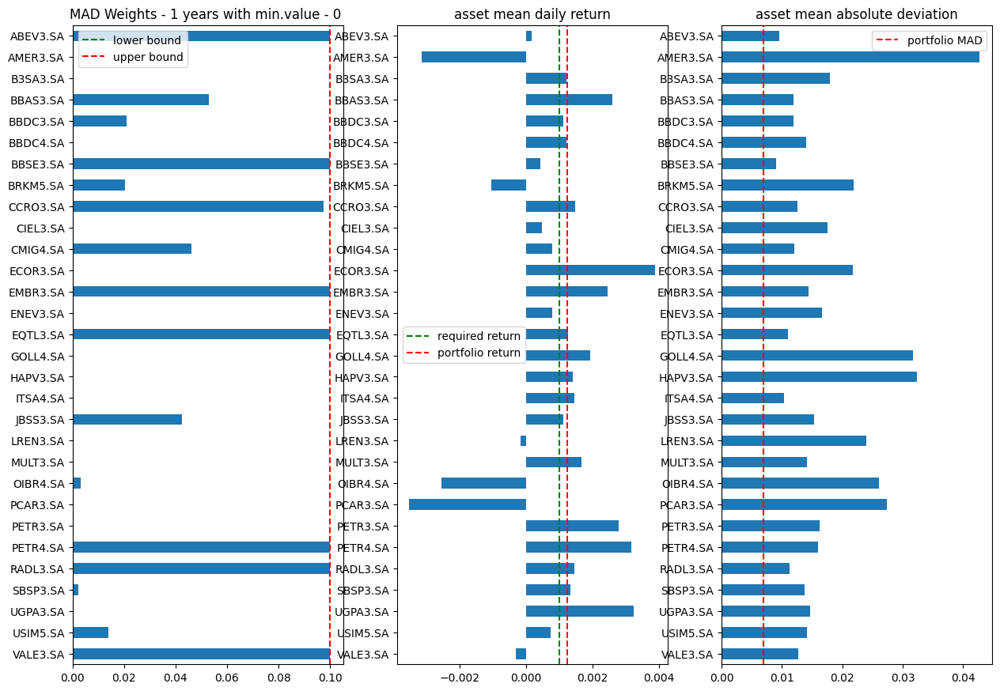

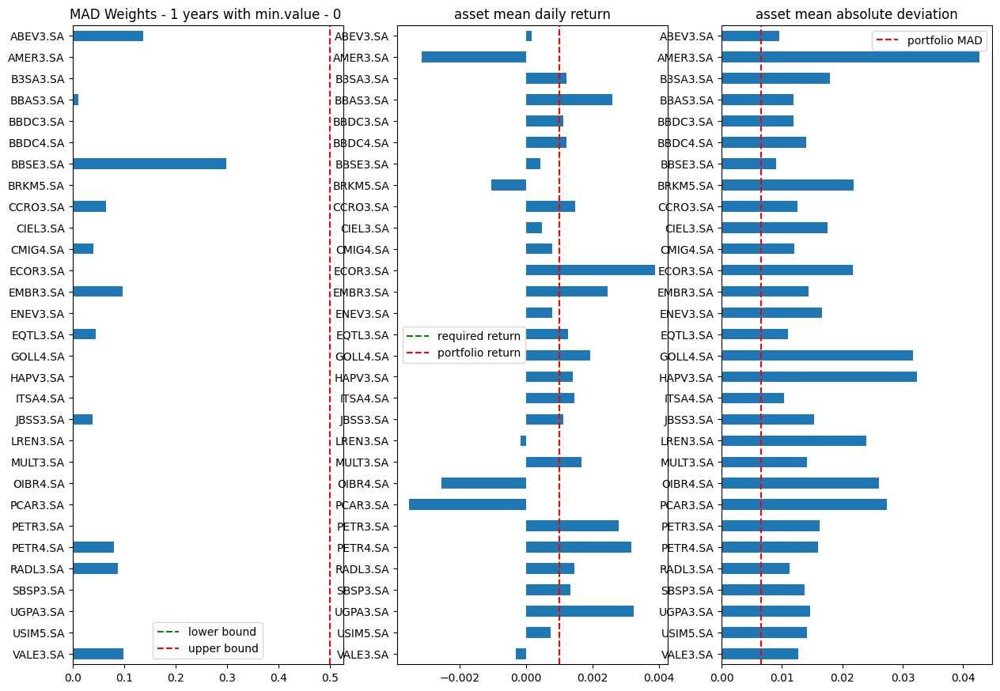

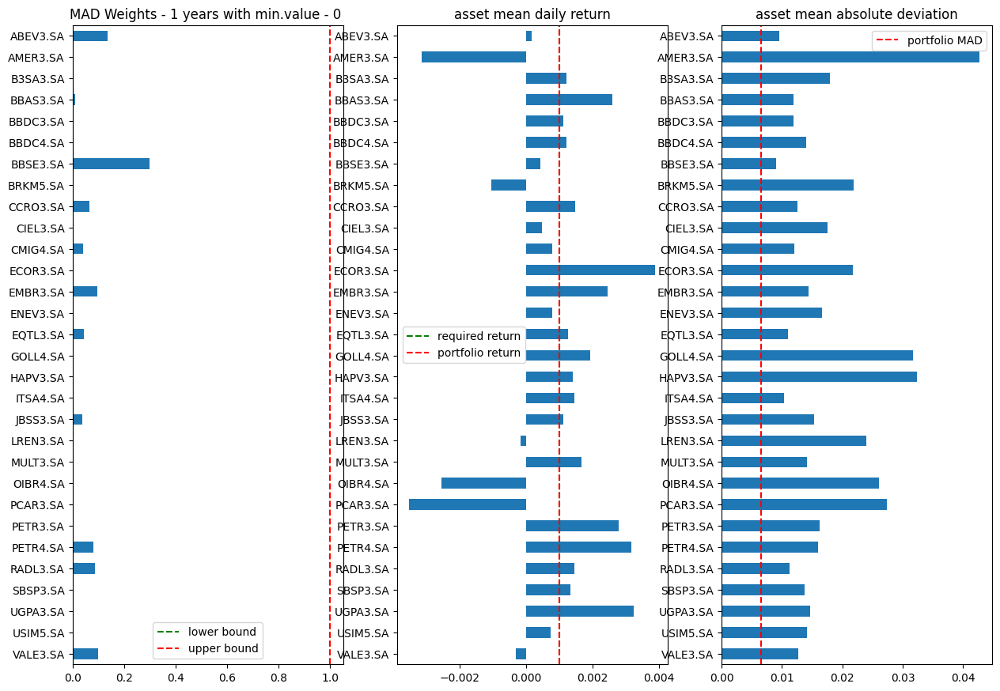

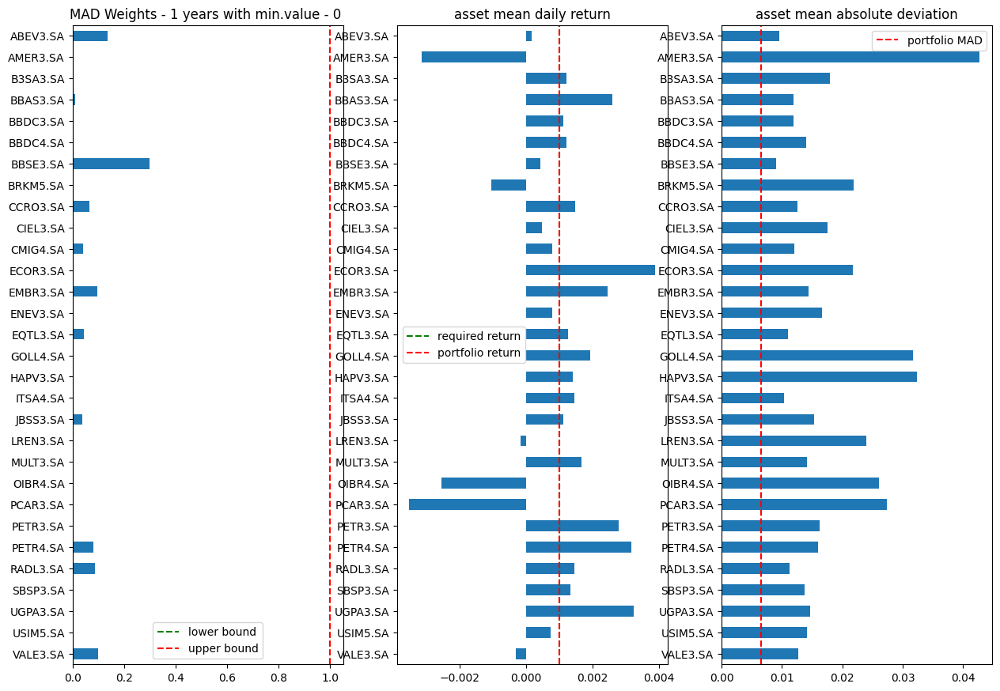

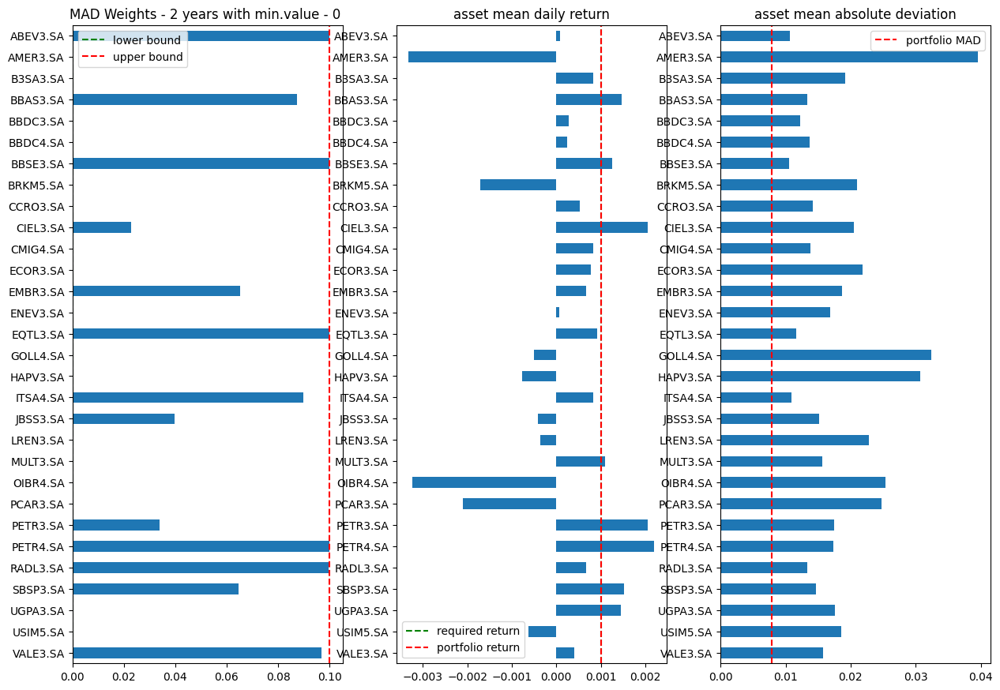

...

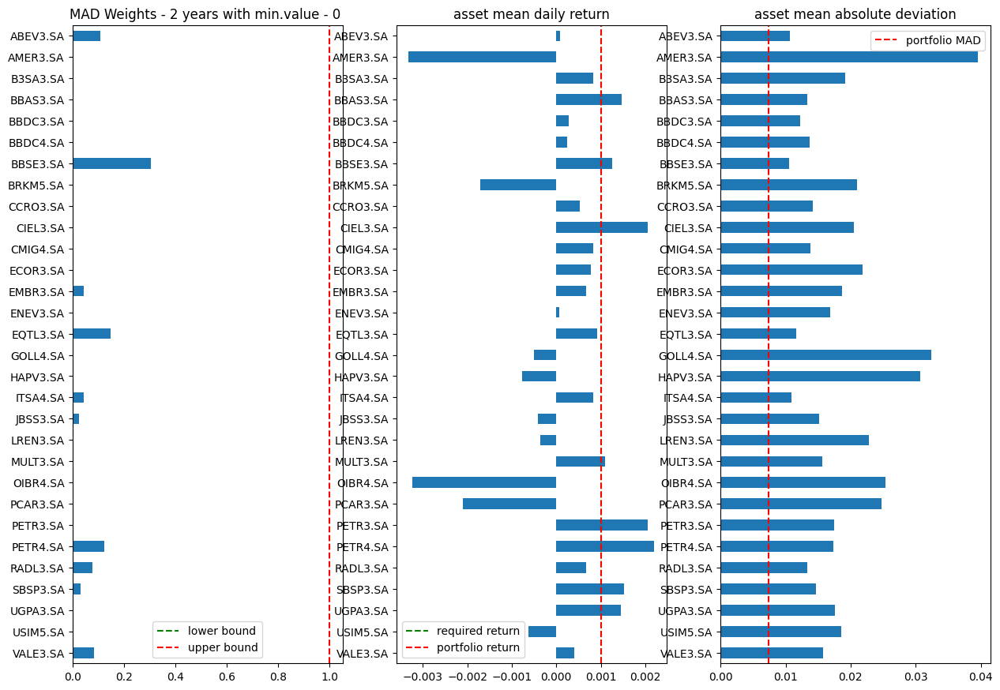

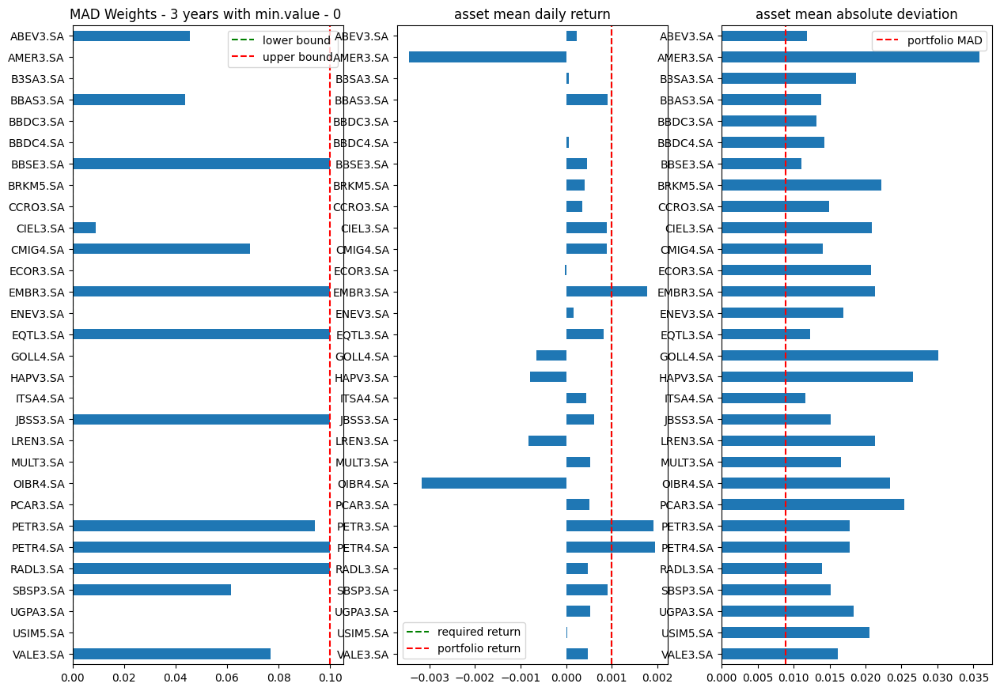

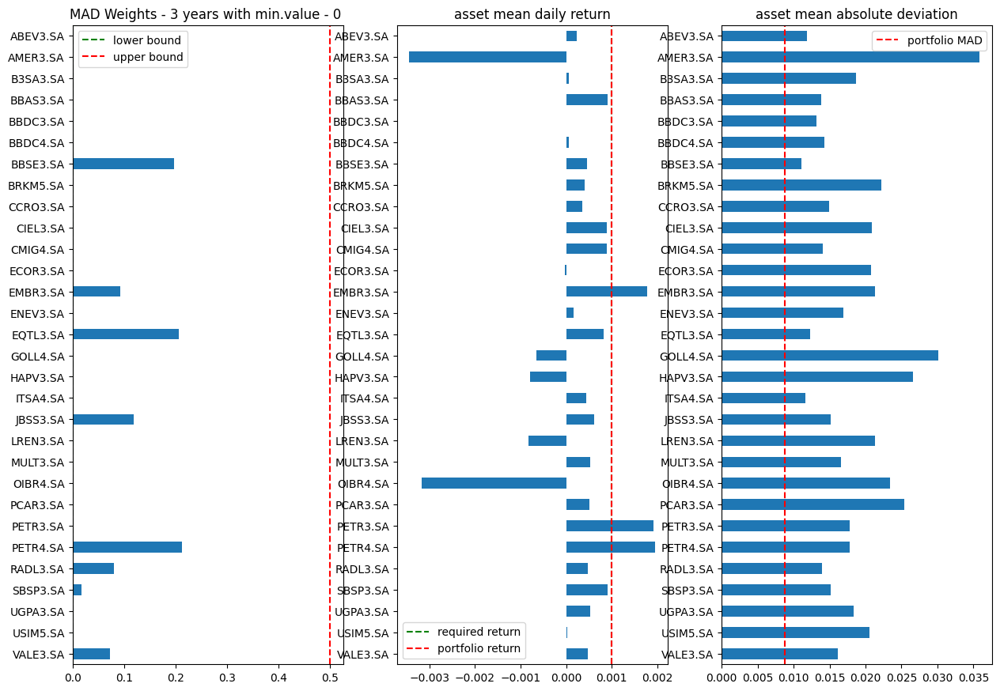

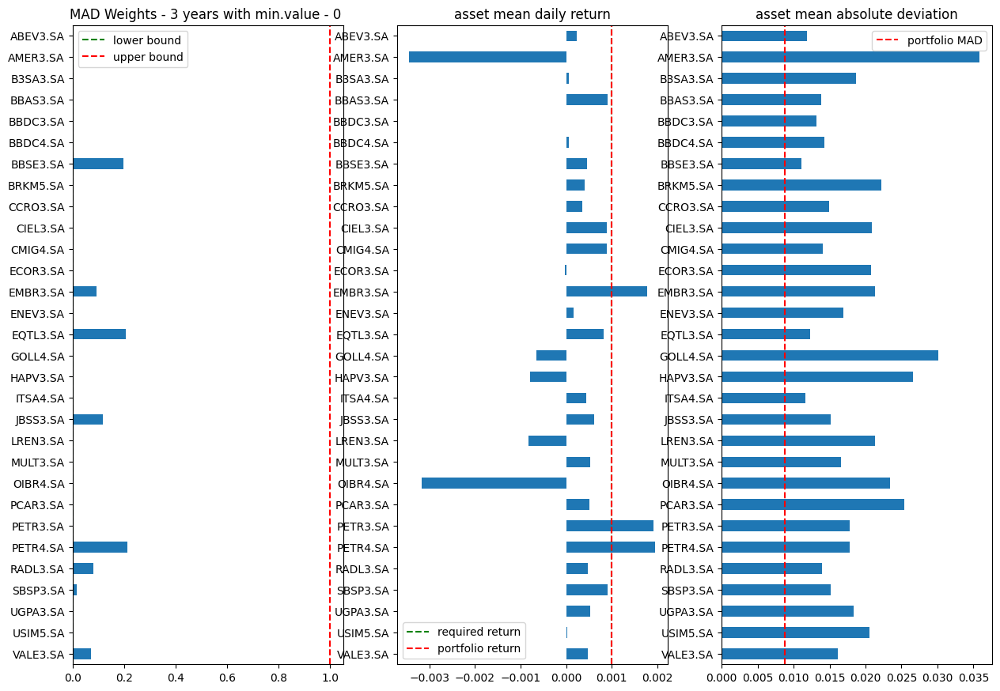

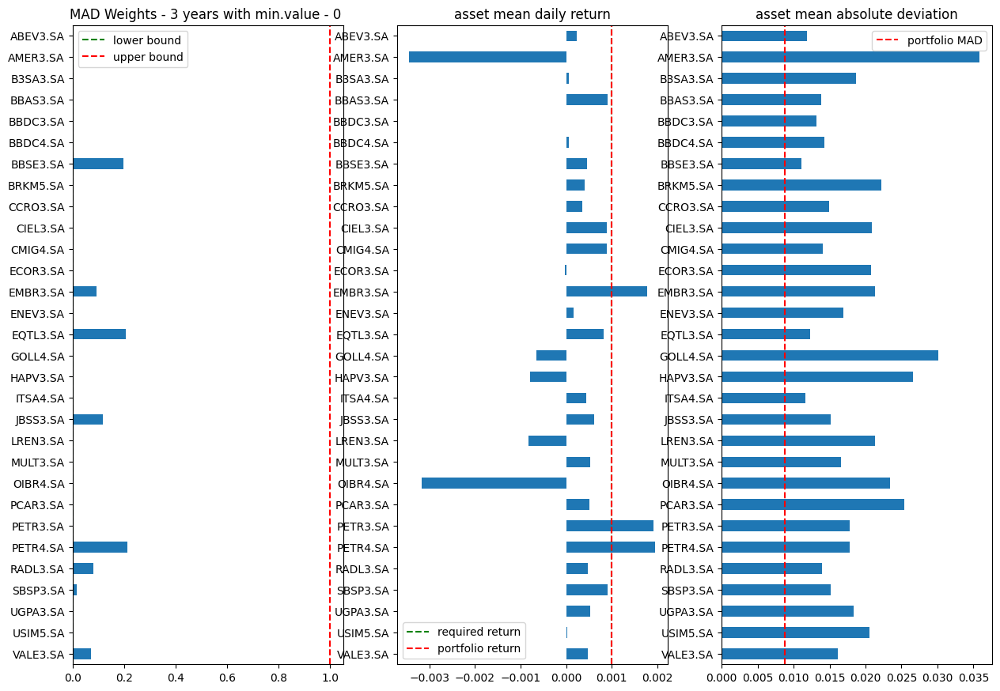

In [ ]:
def mad_portfolio(assets, w_lb,arquivo_mad=1):
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()

    daily_returns["Date"] = daily_returns.index.format()
    daily_returns.set_index("Date", inplace=True)

    ampl = AMPL()
    ampl.read(f"mad_portfolio_{arquivo_mad}.mod")

    ampl.set["ASSETS"] = list(assets.columns)
    ampl.set["TIME"] = daily_returns.index.values

    ampl.param["daily_returns"] = daily_returns
    ampl.param["mean_return"] = mean_return

    # Define w_lb dentro do modelo
    ampl.param["w_lb"] = w_lb

    return ampl

def mad_visualization(assets, m, num_years):
    print('---------------------------------------------------------------------------------')
    mean_portfolio_return = m.get_value("sum{j in ASSETS}(w[j] * mean_return[j])")

    print(f"Weight lower bound                {m.param['w_lb'].value():0.3f}")
    print(f"Weight upper bound                {m.param['w_ub'].value():0.3f}")
    print(
        f"Fraction of portfolio invested     {m.get_value('sum{j in ASSETS} w[j]'):0.3f}"
    )
    print(f"Required portfolio daily return    {m.param['R'].value():0.5f}")
    print(f"Portfolio mean daily return        {mean_portfolio_return:0.5f}")
    print(f"Portfolio mean absolute deviation  {m.obj['MAD'].value():0.5f}")

    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()
    mean_absolute_deviation = abs(daily_returns - mean_return).mean()
    mad_portfolio_weights = m.var["w"].to_pandas()
    #print(m.var['w'].to_pandas())

    fig, ax = plt.subplots(1, 3, figsize=(15, 0.35 * len(daily_returns.columns)))
    mad_portfolio_weights.plot(kind="barh", ax=ax[0], title=f"MAD Weights - {num_years} years with min.value - {m.param['w_lb'].value()} ")
    ax[0].invert_yaxis()
    ax[0].axvline(m.param["w_lb"].value(), ls="--", color="g")
    ax[0].axvline(m.param["w_ub"].value(), ls="--", color="r")
    ax[0].legend(["lower bound", "upper bound"])

    mean_return.plot(kind="barh", ax=ax[1], title="asset mean daily return")
    ax[1].axvline(m.param["R"].value(), ls="--", color="g")

    ax[1].axvline(mean_portfolio_return, ls="--", color="r")
    ax[1].invert_yaxis()
    ax[1].legend(["required return", "portfolio return"])

    mean_absolute_deviation.plot(
        kind="barh", ax=ax[2], title="asset mean absolute deviation"
    )
    ax[2].axvline(m.obj["MAD"].value(), ls="--", color="r")
    ax[2].legend(["portfolio MAD"])
    ax[2].invert_yaxis()

# Substitua os anos abaixo pelos anos desejados (1, 2, 3)
for num_years in [1, 2, 3]:
    # Substitua os valores abaixo pelos valores desejados (0.00, 0.01, 0.012)
    #for w_lb_value in [0.00, 0.01, 0.012]:
      for arquivo in [(1,0.1),(2, 0.5),(3,1),(4,1)]:# O terceiro pode ser um pois não a função foi retirada do arquivo
        # Baixa os dados usando yfinance
        assets = yf.download(tickers, start=pd.to_datetime('today') - pd.DateOffset(years=num_years), end=pd.to_datetime('today'))["Adj Close"]

        # Cria o modelo para os ativos e o valor de w_lb
        m = mad_portfolio(assets, w_lb=0,arquivo_mad = arquivo[0])

        # Configura os parâmetros e resolve o modelo
        m.param["w_ub"] = arquivo[1]
        m.param["R"] = 0.001
        m.option["solver"] = SOLVER
        m.solve()

        # Visualiza os resultados
        mad_visualization(assets, m, num_years)

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 1 anos:
Retorno esperado: 30.04%
Volatilidade esperada: 13.62%


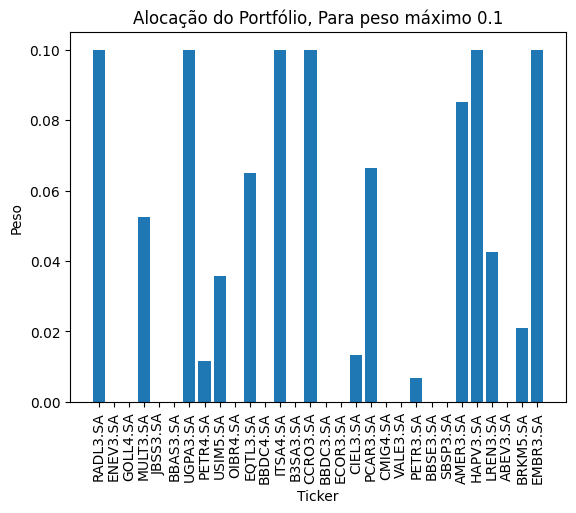


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


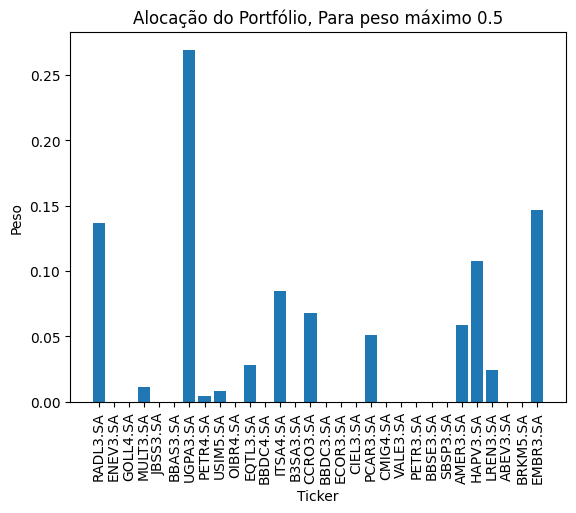


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


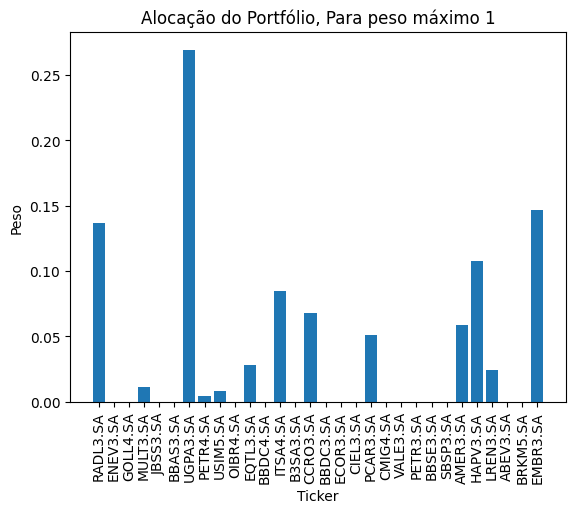


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


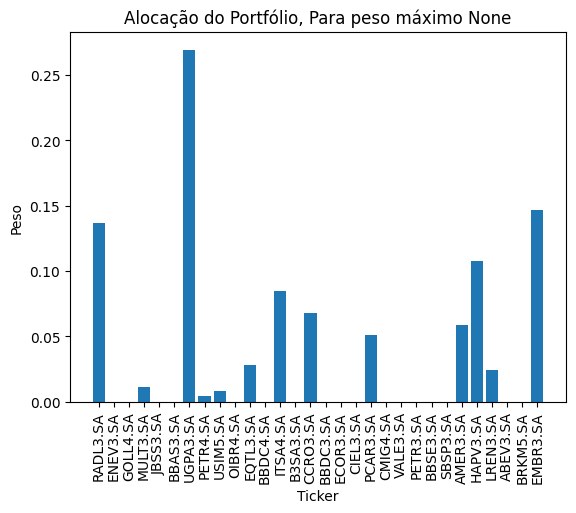


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 2 anos:
Retorno esperado: 17.19%
Volatilidade esperada: 15.66%


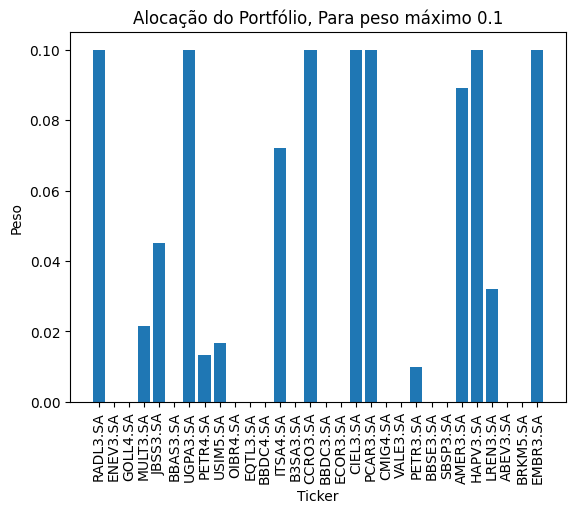


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


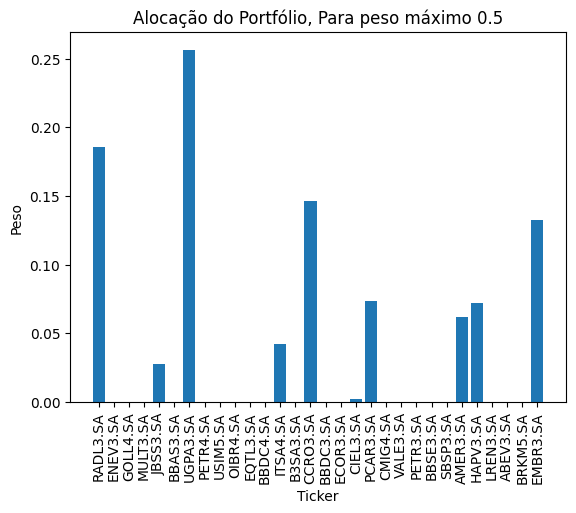


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


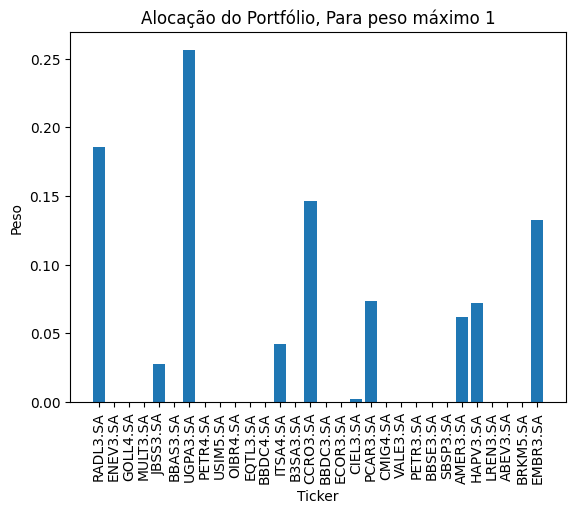


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


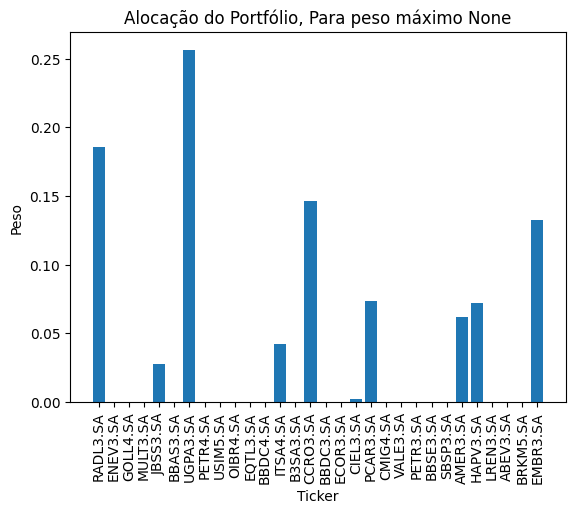


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 3 anos:
Retorno esperado: 14.40%
Volatilidade esperada: 16.96%


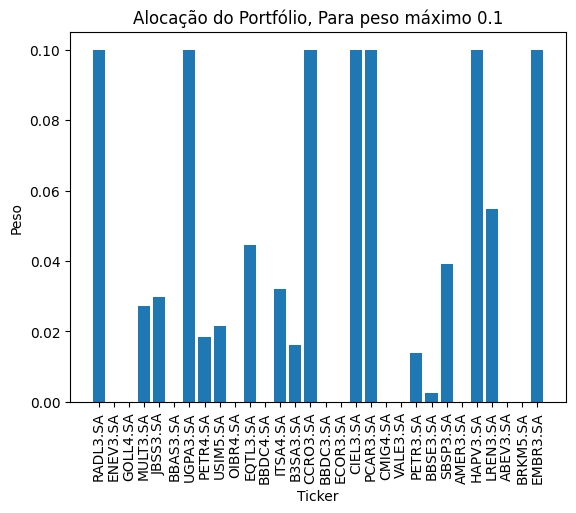


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


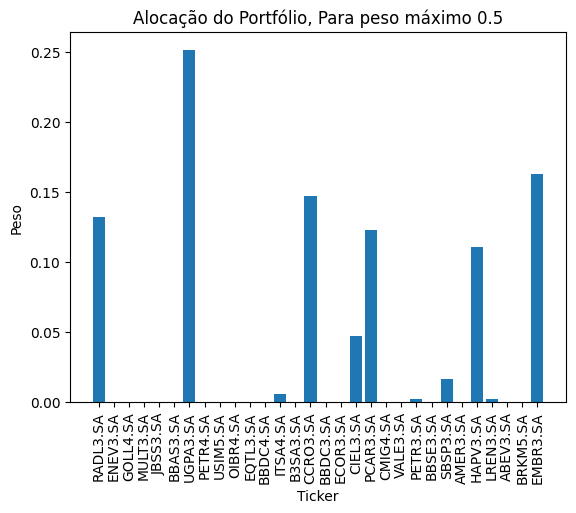


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


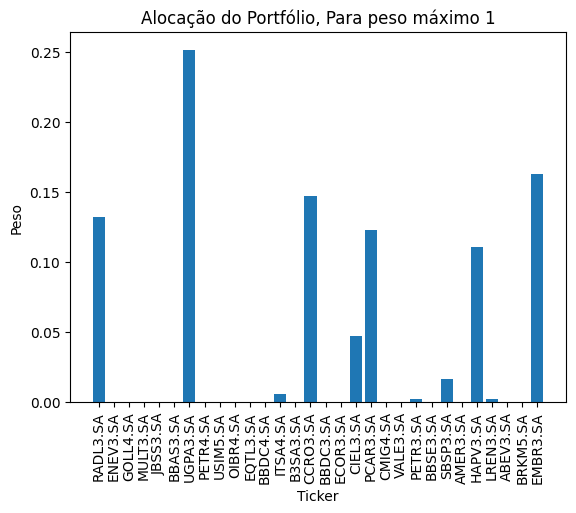


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


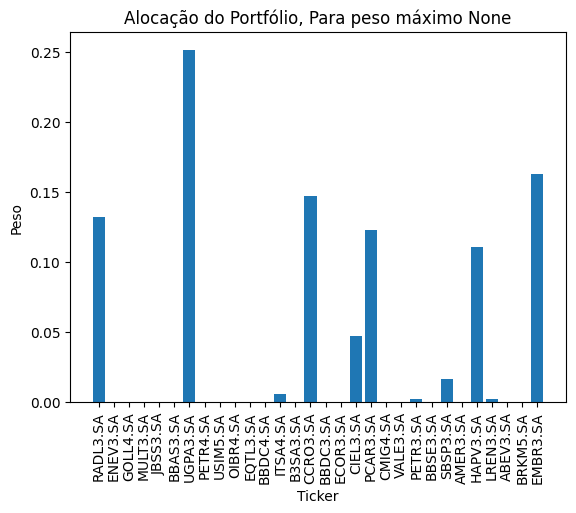

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 1 anos:
Retorno esperado: 30.04%
Volatilidade esperada: 13.62%


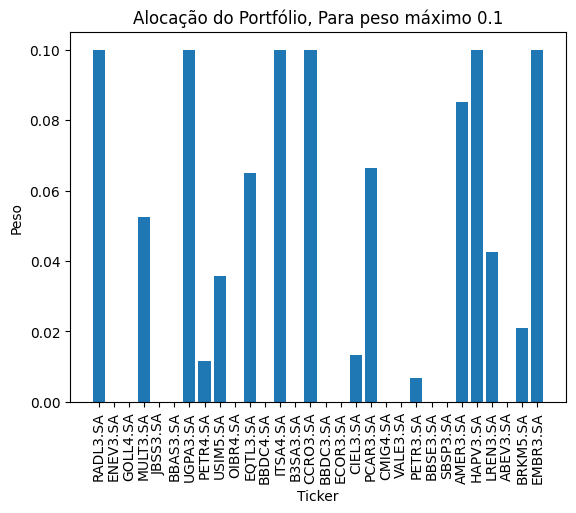


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


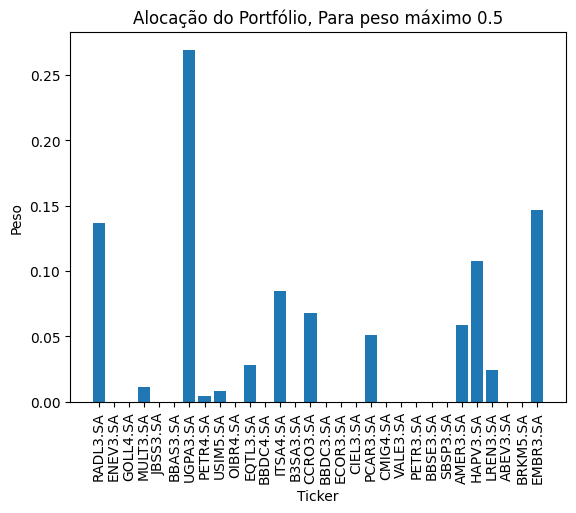


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


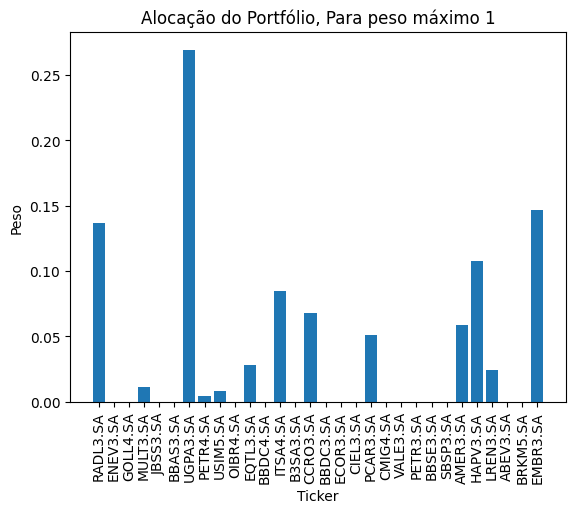


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


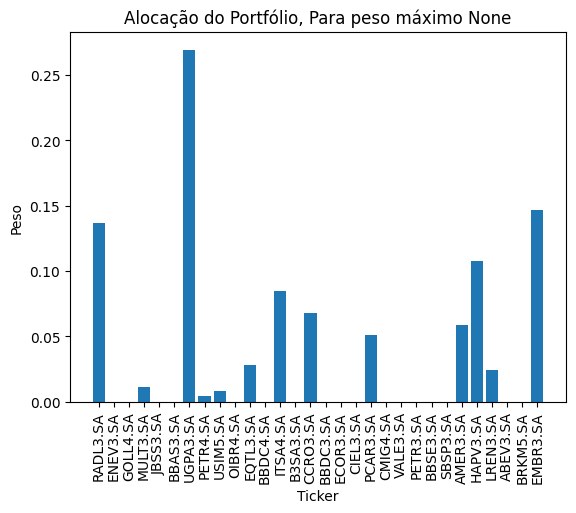


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 2 anos:
Retorno esperado: 17.19%
Volatilidade esperada: 15.66%


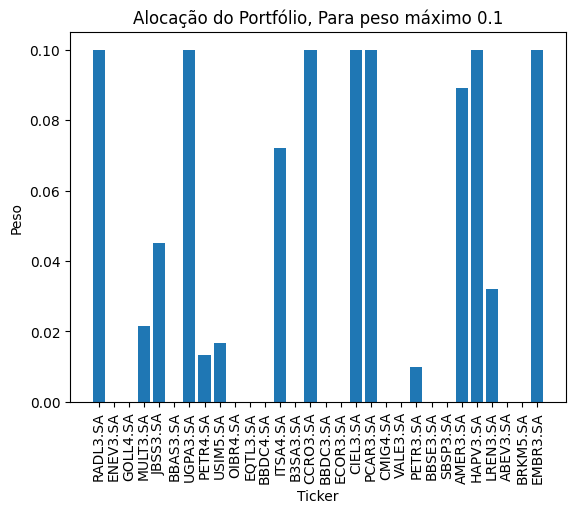


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


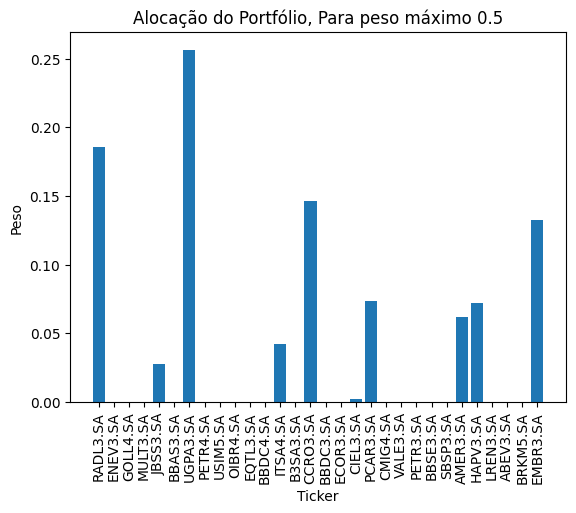


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


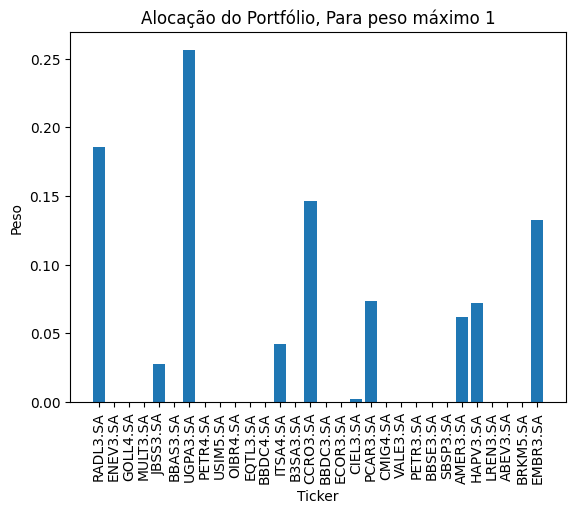


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


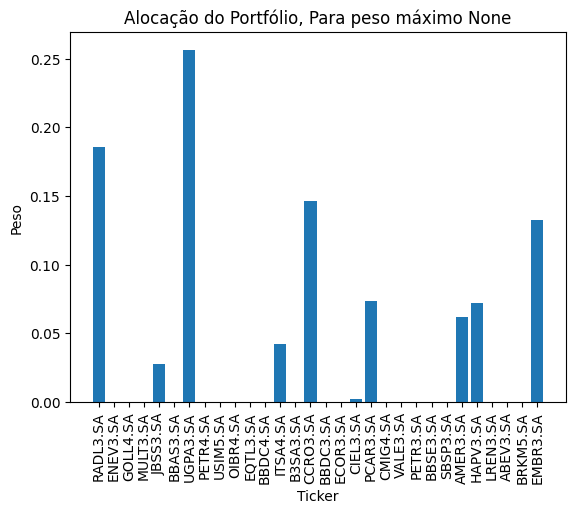


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 3 anos:
Retorno esperado: 14.40%
Volatilidade esperada: 16.96%


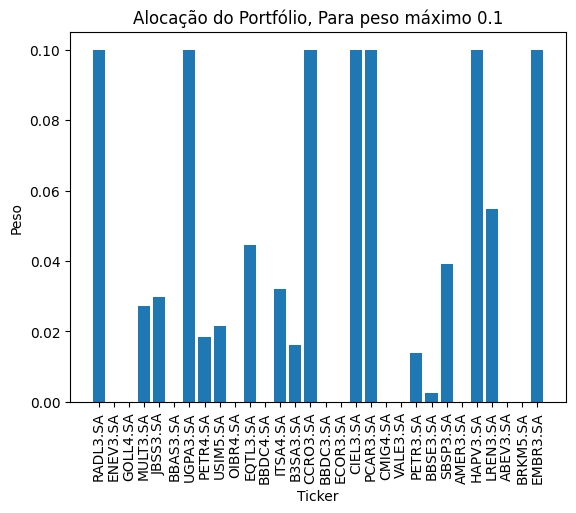


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


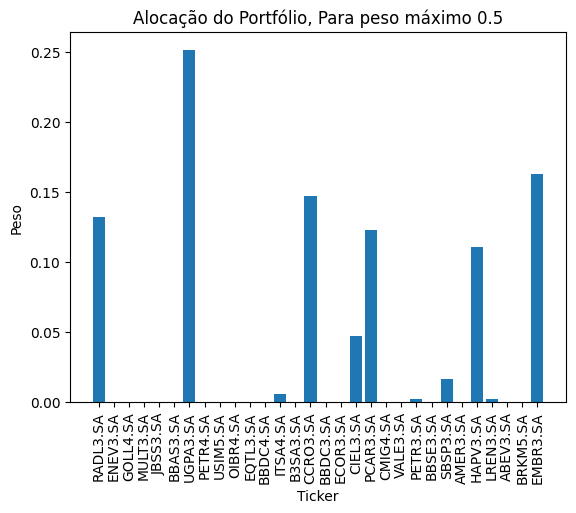


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


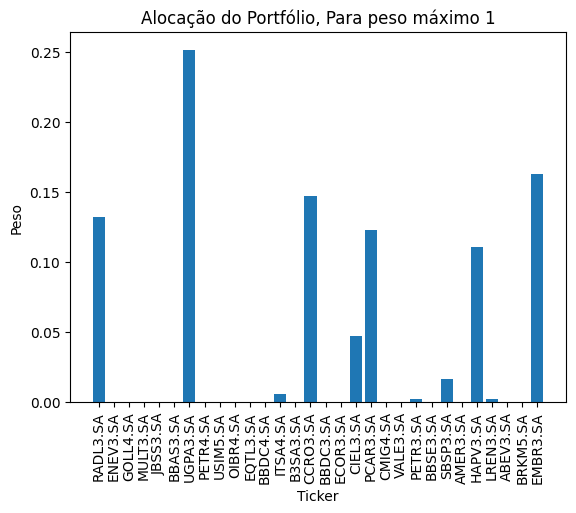


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


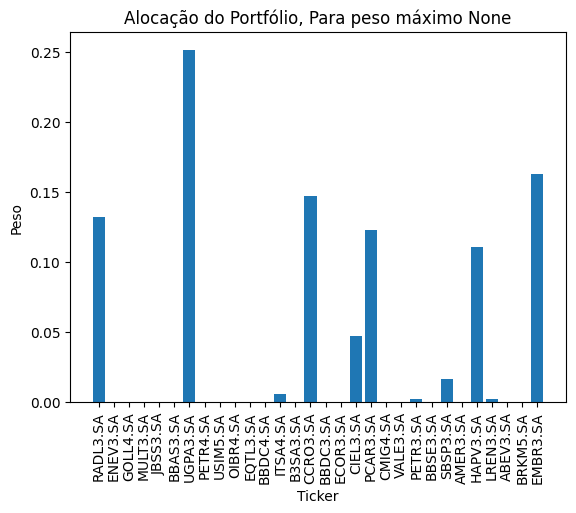

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 1 anos:
Retorno esperado: 30.04%
Volatilidade esperada: 13.62%


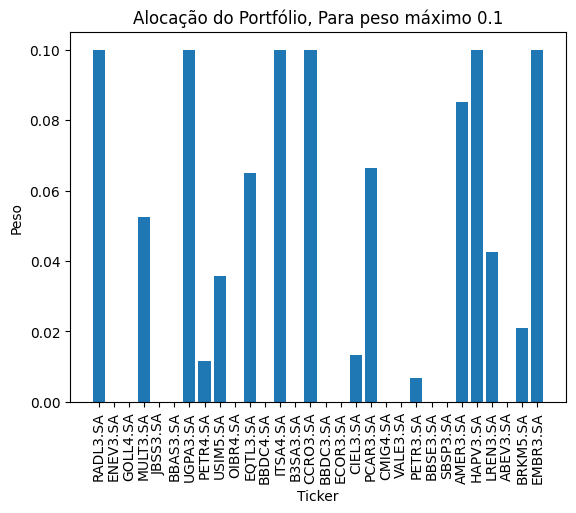


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


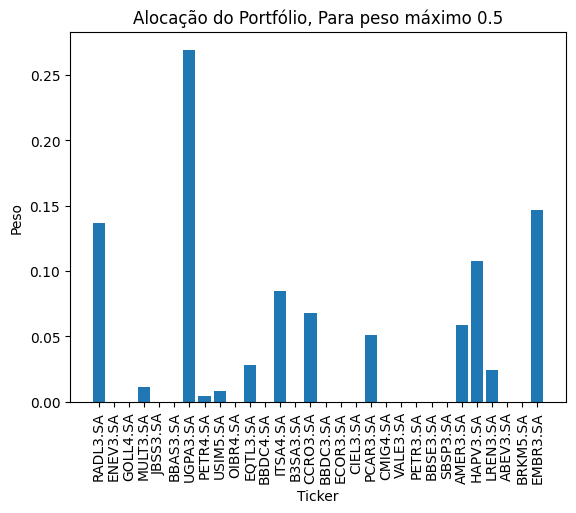


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


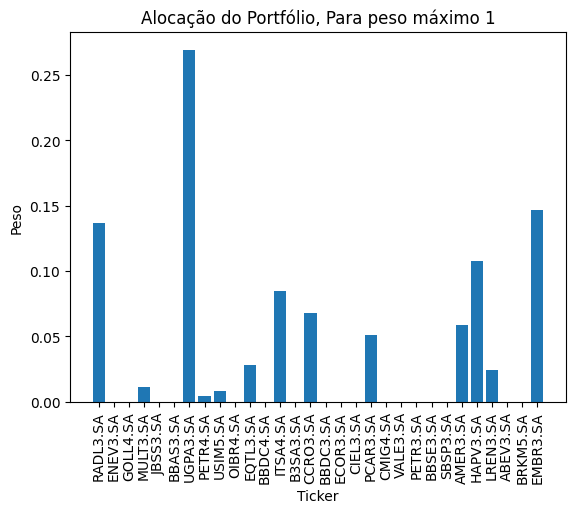


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 1 anos:
Retorno esperado: 22.56%
Volatilidade esperada: 12.92%


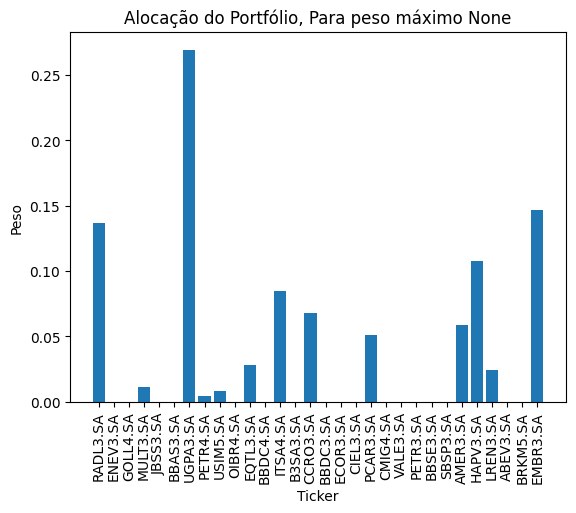


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 2 anos:
Retorno esperado: 17.19%
Volatilidade esperada: 15.66%


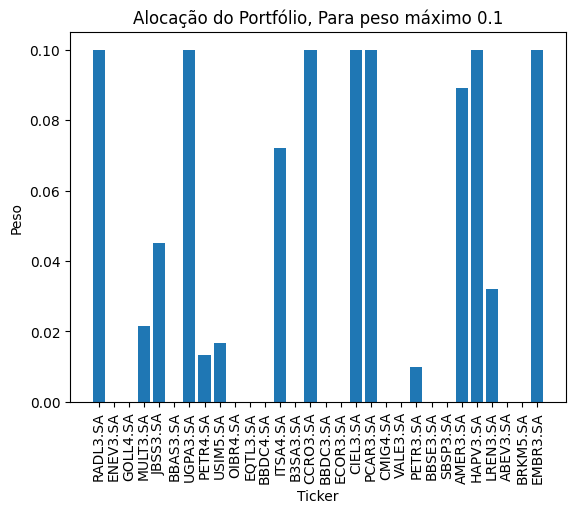


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


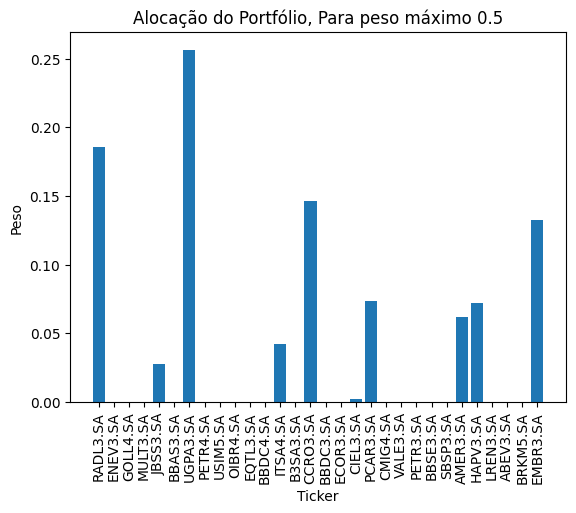


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


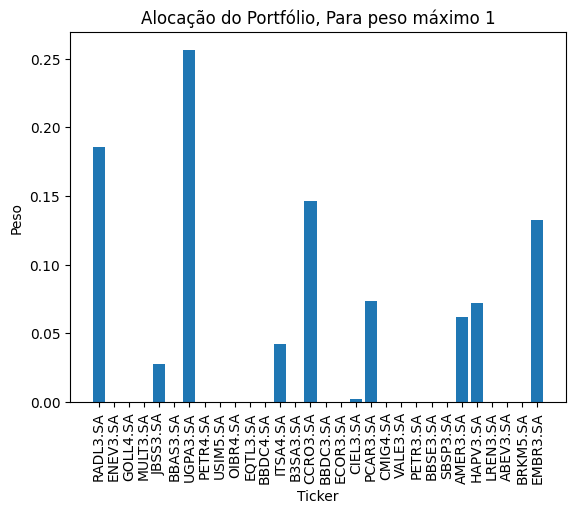


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 2 anos:
Retorno esperado: 18.41%
Volatilidade esperada: 14.78%


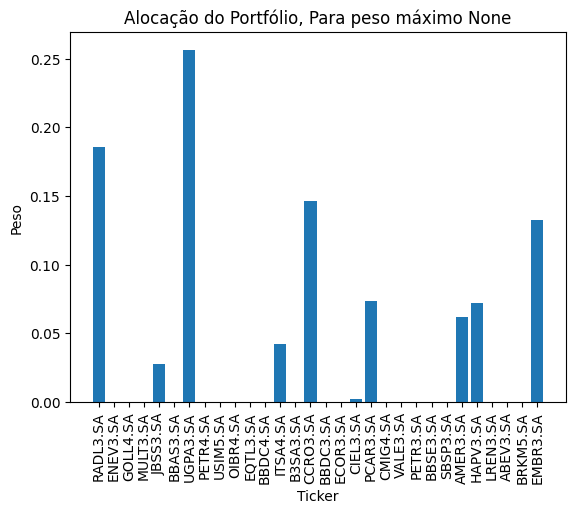


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 3 anos:
Retorno esperado: 14.40%
Volatilidade esperada: 16.96%


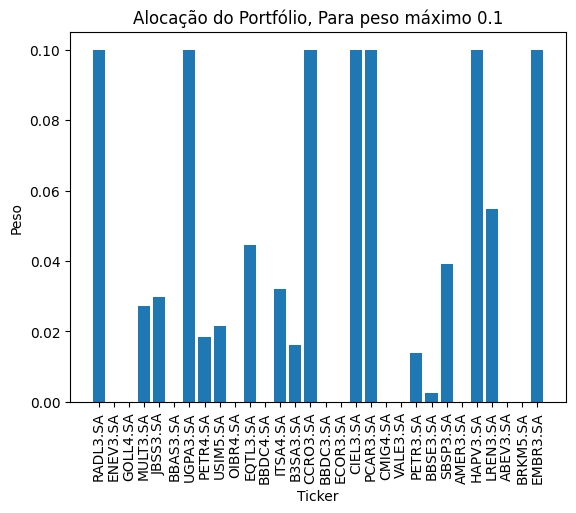


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


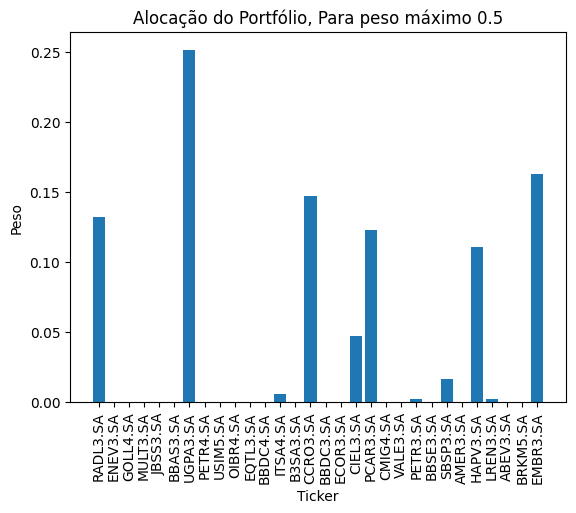


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


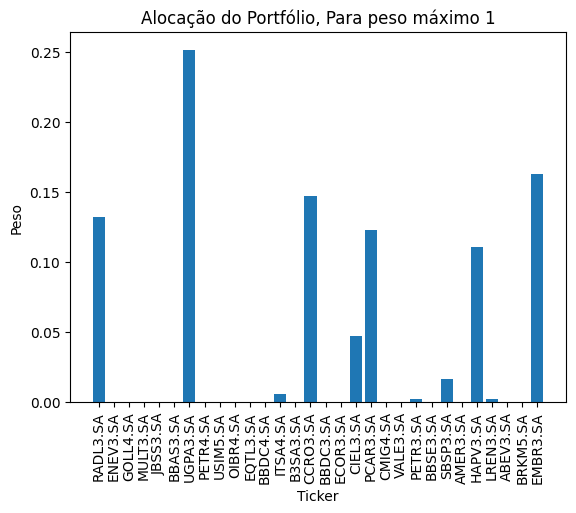


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 3 anos:
Retorno esperado: 13.27%
Volatilidade esperada: 15.98%


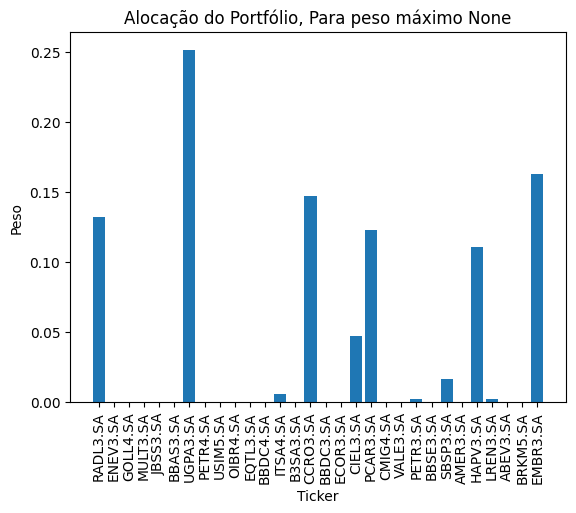

In [ ]:
# Função para baixar dados históricos
def download_data(tickers, start_date, end_date):
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]
    assets.fillna(method="bfill", inplace=True)
    assets.fillna(method="ffill", inplace=True)
    return assets

# Função para calcular o retorno e volatilidade do portfólio
def calculate_portfolio_performance(weights, returns):
    portfolio_return = np.dot(weights, returns.mean()) * 252  # 252 dias úteis em um ano
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(returns.cov() * 252, weights)))
    return portfolio_return, portfolio_volatility

# Função de otimização
def optimize_portfolio(returns, min_return, max_bounds=1):
    num_assets = len(returns.columns)
    initial_weights = np.ones(num_assets) / num_assets  # Alocação igual inicial
    constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1})  # Restrição de alocação total igual a 1
    bounds = tuple((0, max_bounds) for asset in range(num_assets))  # Limites de alocação entre 0 e 1

    # Minimizar a volatilidade sujeita a uma restrição de retorno mínimo
    optimal_weights = minimize(lambda weights: calculate_portfolio_performance(weights, returns)[1],
                               initial_weights, method='SLSQP',
                               bounds=bounds, constraints=constraints)['x']

    # Verificar se o retorno do portfólio otimizado atende ao requisito mínimo
    if calculate_portfolio_performance(optimal_weights, returns)[0] < min_return:
        print(f"Não foi possível atingir o retorno mínimo de {min_return:.2%}.")
        return None

    return optimal_weights

    if calculate_portfolio_performance(optimal_weights, returns)[0] < min_return:
        print(f"Não foi possível atingir o retorno mínimo de {min_return:.2%}.")
        return None

    return dict(zip(tickers, optimal_weights))  # Associar os pesos aos tickers das ações

# Configurar parâmetros
min_returns = [0.00, 0.01, 0.012]  # Exemplo de diferentes valores mínimos de retorno

# Loop sobre diferentes valores mínimos de retorno
for min_return in min_returns:
    # Baixar dados históricos
    assets = download_data(tickers, start_date, end_date)

    # Calcular retornos diários
    returns = assets.pct_change().dropna()

    # Loop sobre diferentes períodos de tempo
    for n_years in [1, 2, 3]:
        # Ajustar a janela de dados
        end_date = dt.datetime.today().date()
        start_date = end_date - dt.timedelta(round(n_years * 365))
        returns_window = returns.loc[start_date:end_date]

        # Otimizar o portfólio
        max_bounds = [0.1, 0.5, 1, None]
        for max_bound in max_bounds:
          weights = optimize_portfolio(returns_window, min_return, max_bound)

          if weights is not None:
              # Calcular e imprimir o retorno e volatilidade do portfólio otimizado
              portfolio_return, portfolio_volatility = calculate_portfolio_performance(weights, returns_window)
              print(f"\nPortfólio otimizado para um retorno mínimo de {min_return:.2%} "
                    f"nos últimos {n_years} anos:")
              print(f"Retorno esperado: {portfolio_return:.2%}")
              print(f"Volatilidade esperada: {portfolio_volatility:.2%}")

              #  Plotar a alocação do portfólio
              plt.bar(tickers, weights)
              plt.title(f"Alocação do Portfólio, Para peso máximo {max_bound}")
              plt.xlabel("Ticker")
              plt.ylabel("Peso")
              plt.xticks(rotation=90)
              plt.show()


### Podemos aumentar a nossa diversificação na quantidade de ações limitando o peso delas no portifolio, no primeiro gráfico de alocação de portifolio limitamos o peso máximo de uma ação até 0.1, causando uma maoir vairição nas ações alocads e um aumento de expressivo no lucro onde para 0.5, 1 e ilimitado o valor do retorno esperado baseado no histórico de 1 ano foi de 30.04% para 22,56%, outro ponto é a volatilidade esperada na qual a diferença nesse um ano foi de 13,62% para peso máximo de 0.1 para 12,92% uma diminuição menos expressiva comparada com a perda de retorno esperado.
### Para 2 anos a converção do retorno esperado tem um cenário diferente, houve um aumento no retorno esperado para alocações de peso 0.1 para os diantes
### No último ano analisdo o maior retorno é para a limitação de peso para 0.1 porém a aumento foi pouco menos significativo se comparado com o tempo de 1 ano e também houve o aumento para a volatilidade esperada em 0.1

### Para todos os anos analisado o retorno esperado e volatilidade para 0.5, 1 e ilimitado, não tiveram valores diferentes pois se observado a maior alocação teve peso 0.25 em todos os cenários.

### 3. Execute os cenários acima sob condições de short selling (nas quais você vende ativos que não possui, contando com uma baixa de preço futura para ganho). Compare os resultados com os obtidos anteriormente.

In [ ]:
%%writefile mad_portfolio.mod

param R default 0;
param w_lb default 0;
param w_ub default 1;

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;

minimize MAD: sum{t in TIME}(u[t] + v[t]) / card(TIME);

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

#s.t. no_short {j in ASSETS}: w[j] >= w_lb; #removendo st que limita para o short selling

s.t. diversify {j in ASSETS}: w[j] <= w_ub;

Writing mad_portfolio.mod


[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.00545407631
327 simplex iterations
0 barrier iterations
 
---------------------------------------------------------------------------------
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested     1.000
Required portfolio daily return    0.00100
Portfolio mean daily return        0.00100
Portfolio mean absolute deviation  0.00545
[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: optimal solution; objective 0.006416003049
702 simplex iterations
0 barrier iterations
 
---------------------------------------------------------------------------------
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested     1.000
Required portfolio daily return    0.00100
Portfolio mean daily retu

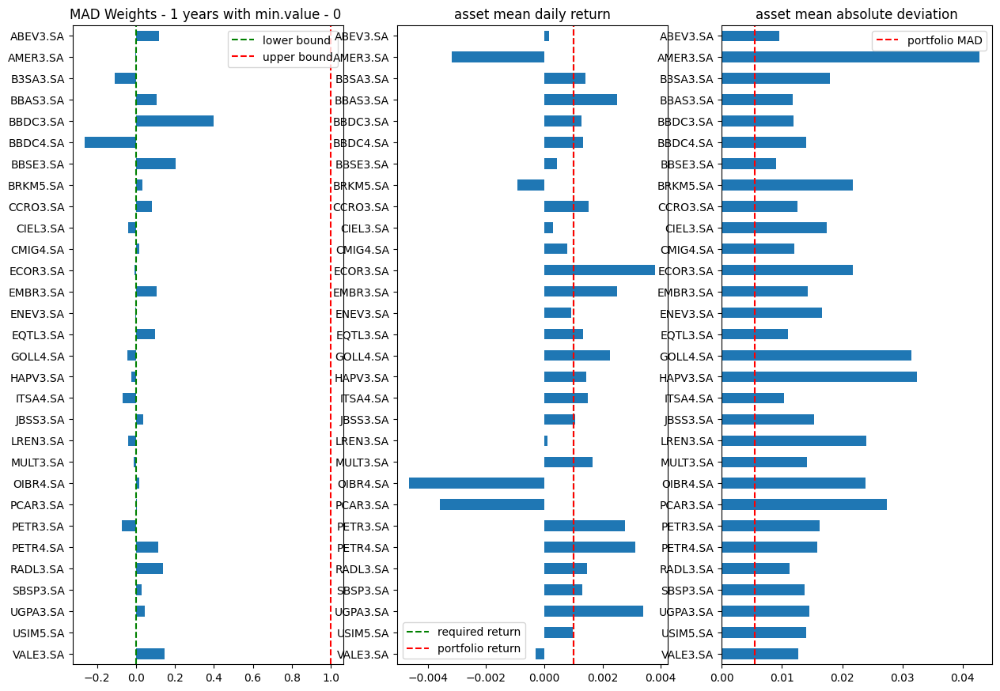

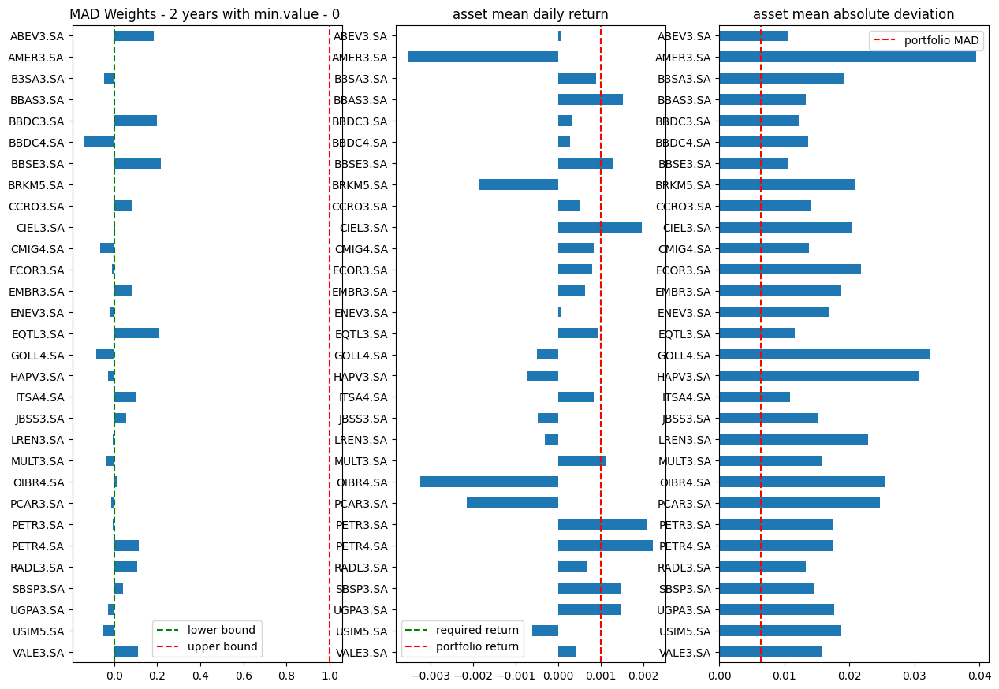

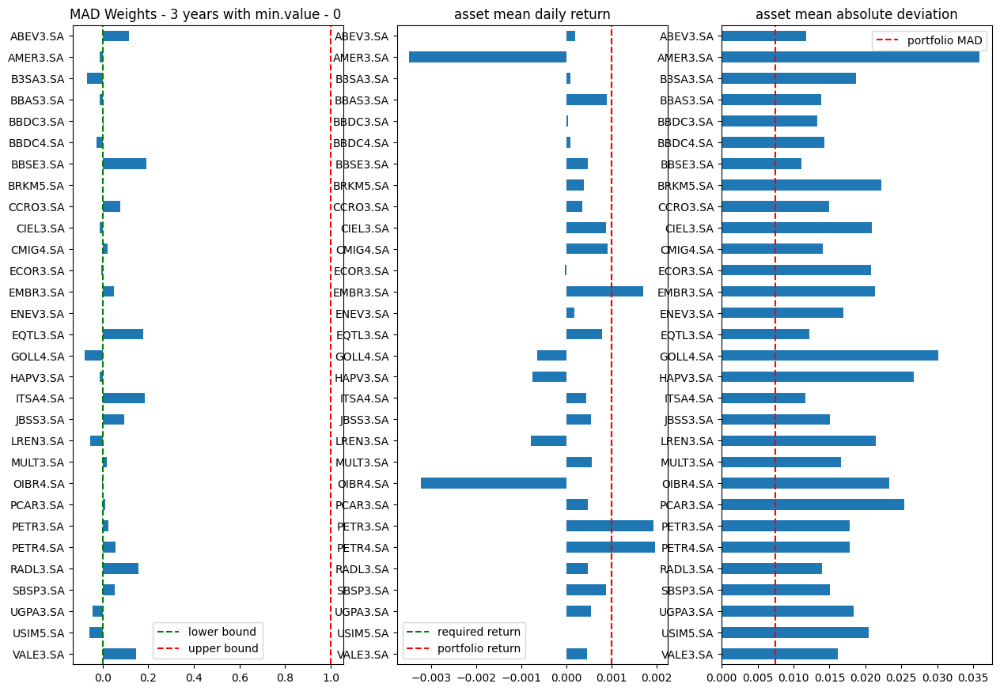

In [ ]:
def mad_portfolio(assets, w_lb):
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()

    daily_returns["Date"] = daily_returns.index.format()
    daily_returns.set_index("Date", inplace=True)

    ampl = AMPL()
    ampl.read(f"mad_portfolio.mod")

    ampl.set["ASSETS"] = list(assets.columns)
    ampl.set["TIME"] = daily_returns.index.values

    ampl.param["daily_returns"] = daily_returns
    ampl.param["mean_return"] = mean_return

    # Define w_lb dentro do modelo
    ampl.param["w_lb"] = w_lb

    return ampl

def mad_visualization(assets, m, num_years):
    print('---------------------------------------------------------------------------------')
    mean_portfolio_return = m.get_value("sum{j in ASSETS}(w[j] * mean_return[j])")

    print(f"Weight lower bound                {m.param['w_lb'].value():0.3f}")
    print(f"Weight upper bound                {m.param['w_ub'].value():0.3f}")
    print(
        f"Fraction of portfolio invested     {m.get_value('sum{j in ASSETS} w[j]'):0.3f}"
    )
    print(f"Required portfolio daily return    {m.param['R'].value():0.5f}")
    print(f"Portfolio mean daily return        {mean_portfolio_return:0.5f}")
    print(f"Portfolio mean absolute deviation  {m.obj['MAD'].value():0.5f}")

    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()
    mean_absolute_deviation = abs(daily_returns - mean_return).mean()
    mad_portfolio_weights = m.var["w"].to_pandas()
    #print(m.var['w'].to_pandas())

    fig, ax = plt.subplots(1, 3, figsize=(15, 0.35 * len(daily_returns.columns)))
    mad_portfolio_weights.plot(kind="barh", ax=ax[0], title=f"MAD Weights - {num_years} years with min.value - {m.param['w_lb'].value()} ")
    ax[0].invert_yaxis()
    ax[0].axvline(m.param["w_lb"].value(), ls="--", color="g")
    ax[0].axvline(m.param["w_ub"].value(), ls="--", color="r")
    ax[0].legend(["lower bound", "upper bound"])

    mean_return.plot(kind="barh", ax=ax[1], title="asset mean daily return")
    ax[1].axvline(m.param["R"].value(), ls="--", color="g")

    ax[1].axvline(mean_portfolio_return, ls="--", color="r")
    ax[1].invert_yaxis()
    ax[1].legend(["required return", "portfolio return"])

    mean_absolute_deviation.plot(
        kind="barh", ax=ax[2], title="asset mean absolute deviation"
    )
    ax[2].axvline(m.obj["MAD"].value(), ls="--", color="r")
    ax[2].legend(["portfolio MAD"])
    ax[2].invert_yaxis()

# Substitua os anos abaixo pelos anos desejados (1, 2, 3)
for num_years in [1, 2, 3]:
    # Substitua os valores abaixo pelos valores desejados (0.00, 0.01, 0.012)
    #for w_lb_value in [0.00, 0.01, 0.012]:
    #  for arquivo in [(1,0.1),(2, 0.5),(3,1),(4,1)]:# O terceiro pode ser um pois não a função foi retirada do arquivo
        # Baixa os dados usando yfinance
        assets = yf.download(tickers, start=pd.to_datetime('today') - pd.DateOffset(years=num_years), end=pd.to_datetime('today'))["Adj Close"]

        # Cria o modelo para os ativos e o valor de w_lb
        m = mad_portfolio(assets, w_lb=0)

        # Configura os parâmetros e resolve o modelo
        m.param["w_ub"] = 1
        m.param["R"] = 0.001
        m.option["solver"] = SOLVER
        m.solve()

        # Visualiza os resultados
        mad_visualization(assets, m, num_years)

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 1 anos:
Retorno esperado: 25.16%
Volatilidade esperada: 11.10%


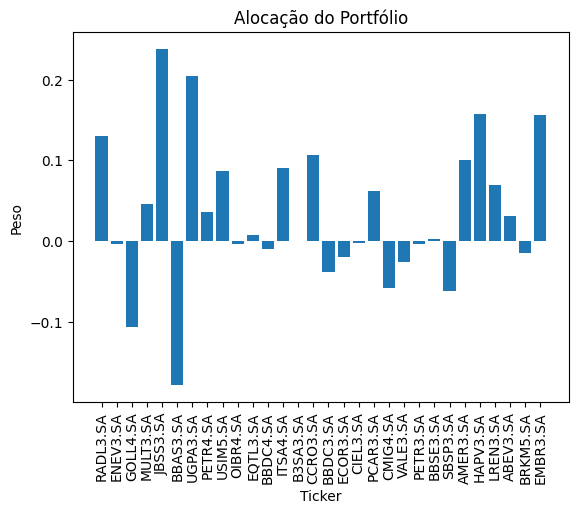


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 2 anos:
Retorno esperado: 19.90%
Volatilidade esperada: 12.87%


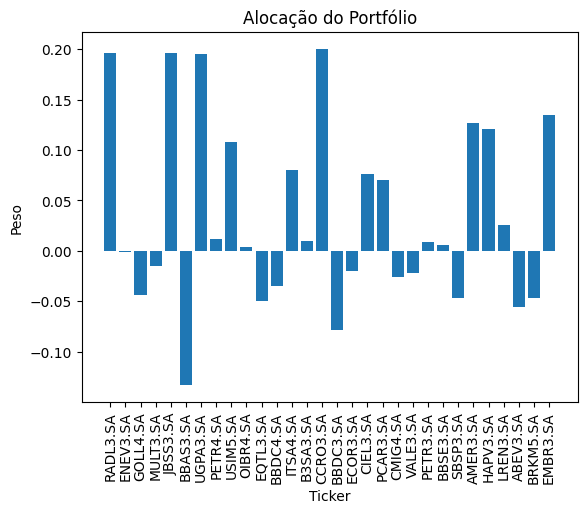


Portfólio otimizado para um retorno mínimo de 0.00% nos últimos 3 anos:
Retorno esperado: 16.84%
Volatilidade esperada: 14.81%


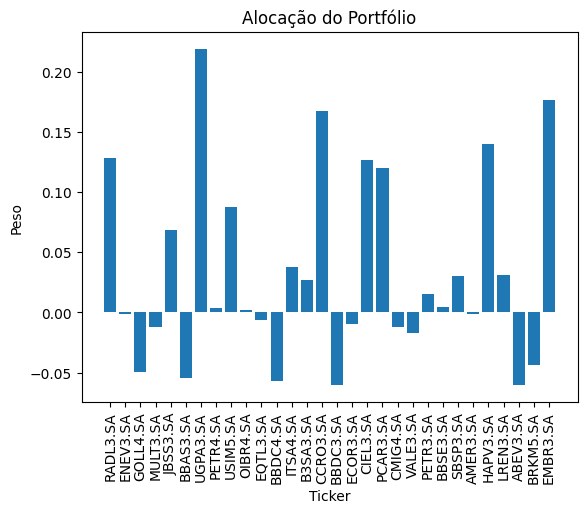

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 1 anos:
Retorno esperado: 25.16%
Volatilidade esperada: 11.10%


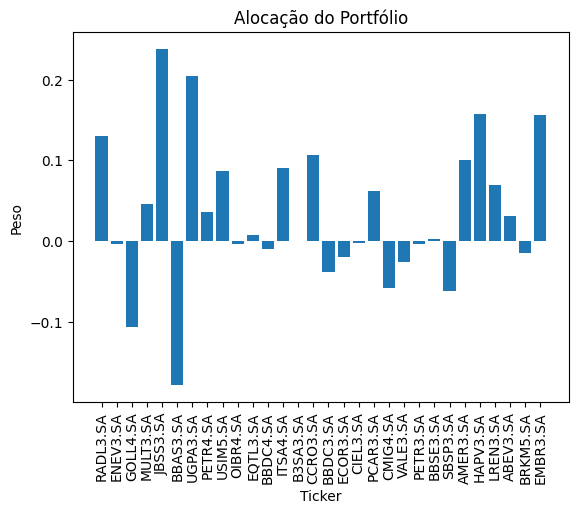


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 2 anos:
Retorno esperado: 19.90%
Volatilidade esperada: 12.87%


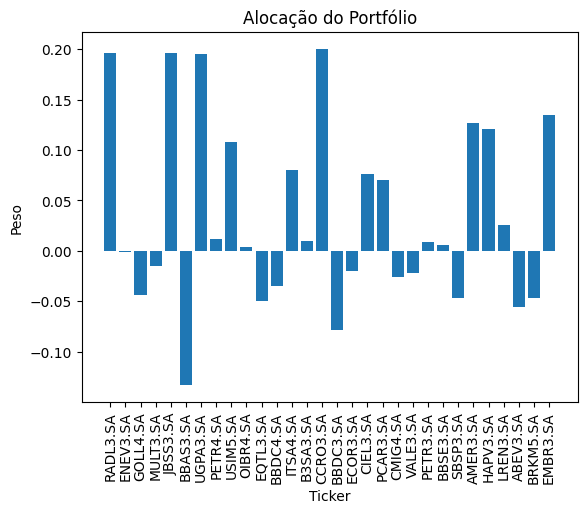


Portfólio otimizado para um retorno mínimo de 1.00% nos últimos 3 anos:
Retorno esperado: 16.84%
Volatilidade esperada: 14.81%


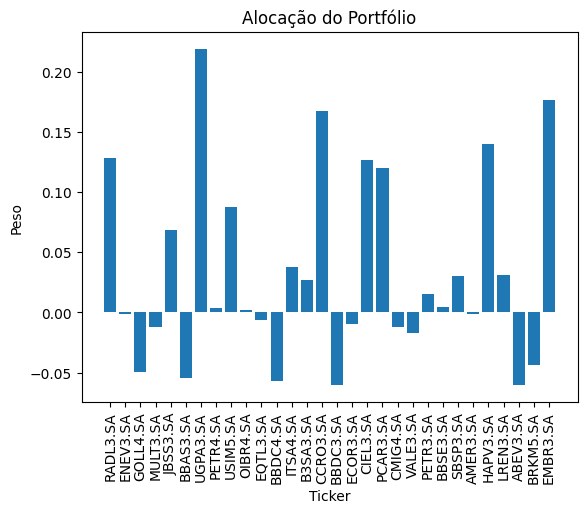

[*********************100%%**********************]  30 of 30 completed

Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 1 anos:
Retorno esperado: 25.16%
Volatilidade esperada: 11.10%


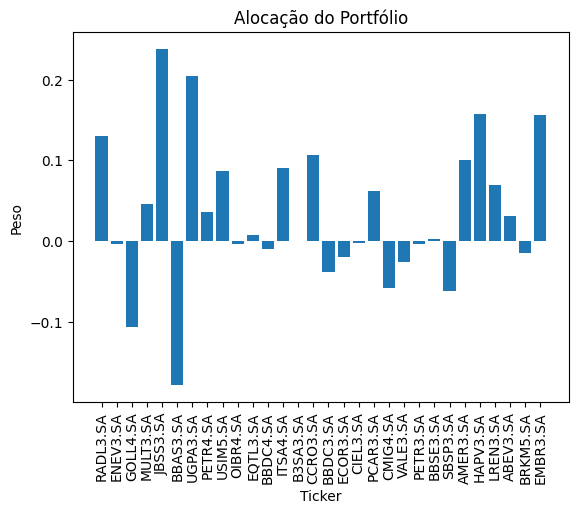


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 2 anos:
Retorno esperado: 19.90%
Volatilidade esperada: 12.87%


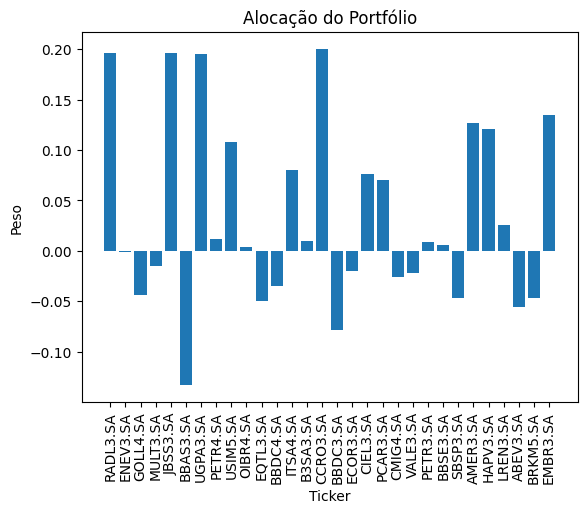


Portfólio otimizado para um retorno mínimo de 1.20% nos últimos 3 anos:
Retorno esperado: 16.84%
Volatilidade esperada: 14.81%


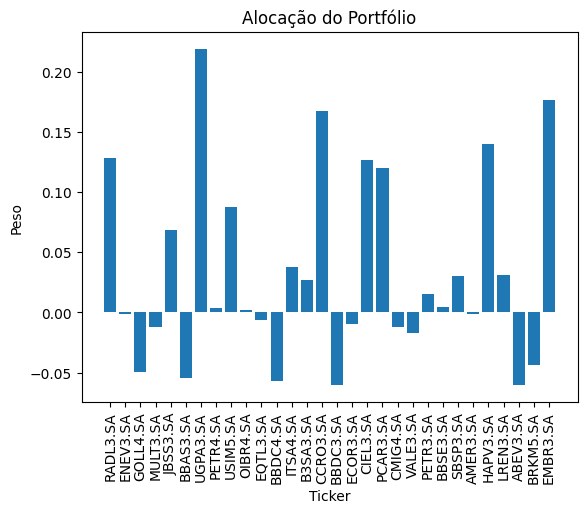

In [ ]:
# Função para baixar dados históricos
def download_data(tickers, start_date, end_date):
    assets = yf.download(tickers, start=start_date, end=end_date)["Adj Close"]
    assets.fillna(method="bfill", inplace=True)
    assets.fillna(method="ffill", inplace=True)
    return assets

# Função para calcular o retorno e volatilidade do portfólio
def calculate_portfolio_performance(weights, returns):
    portfolio_return = np.dot(weights, returns.mean()) * 252  # 252 dias úteis em um ano
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(returns.cov() * 252, weights)))
    return portfolio_return, portfolio_volatility

# Função de otimização
def optimize_portfolio(returns, min_return):
    num_assets = len(returns.columns)
    initial_weights = np.ones(num_assets) / num_assets  # Alocação igual inicial
    constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1})  # Restrição de alocação total igual a 1
    # bounds = tuple((-0.5,0.5 ) for asset in range(num_assets))  # Limites de alocação entre 0 e 1

    # Minimizar a volatilidade sujeita a uma restrição de retorno mínimo
    optimal_weights = minimize(lambda weights: calculate_portfolio_performance(weights, returns)[1],
                               initial_weights, method='SLSQP',
                              constraints=constraints)['x']

    # Verificar se o retorno do portfólio otimizado atende ao requisito mínimo
    if calculate_portfolio_performance(optimal_weights, returns)[0] < min_return:
        print(f"Não foi possível atingir o retorno mínimo de {min_return:.2%}.")
        return None

    return optimal_weights

    if calculate_portfolio_performance(optimal_weights, returns)[0] < min_return:
        print(f"Não foi possível atingir o retorno mínimo de {min_return:.2%}.")
        return None

    return dict(zip(tickers, optimal_weights))  # Associar os pesos aos tickers das ações

# Configurar parâmetros
min_returns = [0.00, 0.01, 0.012]  # Exemplo de diferentes valores mínimos de retorno

# Loop sobre diferentes valores mínimos de retorno
for min_return in min_returns:
    # Baixar dados históricos
    assets = download_data(tickers, start_date, end_date)

    # Calcular retornos diários
    returns = assets.pct_change().dropna()

    # Loop sobre diferentes períodos de tempo
    for n_years in [1, 2, 3]:
        # Ajustar a janela de dados
        end_date = dt.datetime.today().date()
        start_date = end_date - dt.timedelta(round(n_years * 365))
        returns_window = returns.loc[start_date:end_date]

        # Otimizar o portfólio
        weights = optimize_portfolio(returns_window, min_return)

        if weights is not None:
            # Calcular e imprimir o retorno e volatilidade do portfólio otimizado
            portfolio_return, portfolio_volatility = calculate_portfolio_performance(weights, returns_window)
            print(f"\nPortfólio otimizado para um retorno mínimo de {min_return:.2%} "
                  f"nos últimos {n_years} anos:")
            print(f"Retorno esperado: {portfolio_return:.2%}")
            print(f"Volatilidade esperada: {portfolio_volatility:.2%}")

            # Plotar a alocação do portfólio
            plt.bar(tickers, weights)
            plt.title("Alocação do Portfólio")
            plt.xlabel("Ticker")
            plt.ylabel("Peso")
            plt.xticks(rotation=90)
            plt.show()

### Removemos dos arquivos a restrição "s.t. no_short {j in ASSETS}: w[j] >= w_lb" que impedia o short-selling


-> precisamos falar na mudança de valor da fnção objetivo <br>
-> dos pesos no mortifolio  <br>
-> e da alocação do portifolio, a compra não é mais alta que 0.20 de peso



---





---



### 4. Modifique o código fornecido para usar a medida de risco (1) em vez da MAD e rode novamente seus experimentos variando o valor de p. Faça comparações entre os valores obtidos e reporte diferenças significativas, caso existam.

Para a resolução abaixo variando o p, o tempo definido foi de três anos, o valor mínimo de 0.00 e o valor máximo de 1.00.

In [ ]:
%%writefile mad_portfolio_p_quantile.mod

param R default 0;
param w_lb default 0;
param w_ub default 1;
param p_quantile default 0.01;  # Adicionado o parâmetro p_quantile

set ASSETS;
set TIME;

param daily_returns{TIME, ASSETS};
param mean_return{ASSETS};

var w{ASSETS};
var u{TIME} >= 0;
var v{TIME} >= 0;
var z;  # Removida a restrição para >= 0

# Utilize a medida de risco baseada em p_quantile
minimize risk_measure: -sum{t in TIME}(1 / card(TIME) * (u[t] + v[t])) + p_quantile * z;

s.t. portfolio_returns {t in TIME}:
    u[t] - v[t] == sum{j in ASSETS}(w[j] * (daily_returns[t, j] - mean_return[j]));

s.t. sum_of_weights: sum{j in ASSETS} w[j] == 1;

s.t. mean_portfolio_return: sum{j in ASSETS}(w[j] * mean_return[j]) >= R;

s.t. no_short {j in ASSETS}: w[j] >= w_lb;

s.t. diversify {j in ASSETS}: w[j] <= w_ub;

s.t. risk_constraint {t in TIME}:
    z >= sum{j in ASSETS} (daily_returns[t, j] - mean_return[j]) * w[j];

Writing mad_portfolio_p_quantile.mod


**Parte 4.a.** Modelo com medida de risco

Os valores de p foram de 0.01, 0.05 e 0.08.

[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: unbounded problem
3469 simplex iterations
0 barrier iterations
 
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested   1.000
Required portfolio daily return  0.00100
Portfolio mean daily return      0.00103
Portfolio risk measure (p=0.005): 0.01430


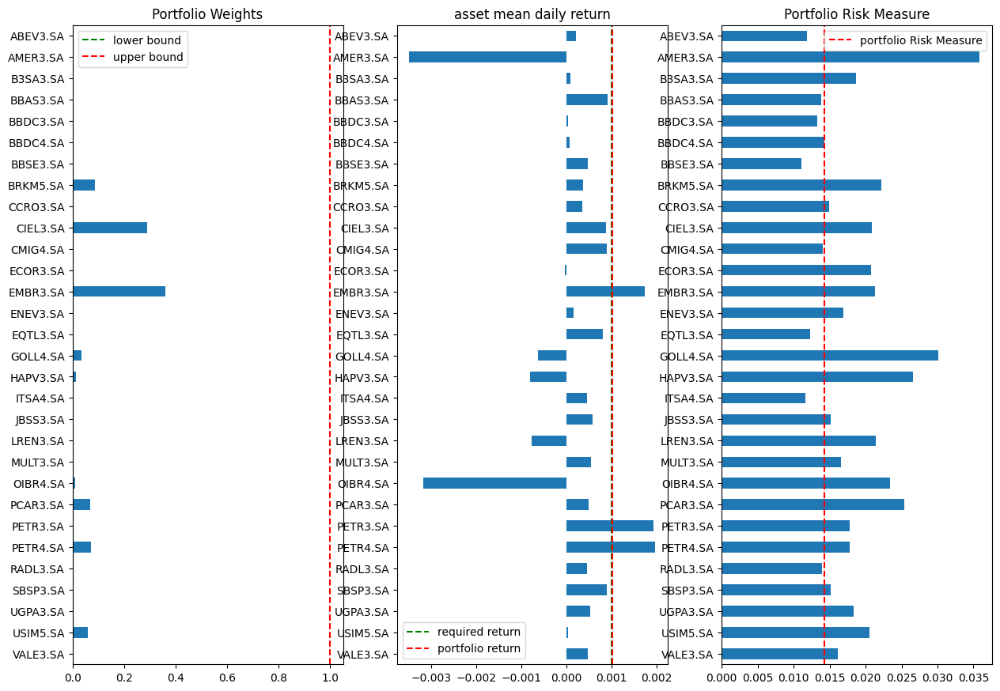

[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: unbounded problem
3330 simplex iterations
0 barrier iterations
 
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested   1.000
Required portfolio daily return  0.00100
Portfolio mean daily return      0.00100
Portfolio risk measure (p=0.01): 0.01977


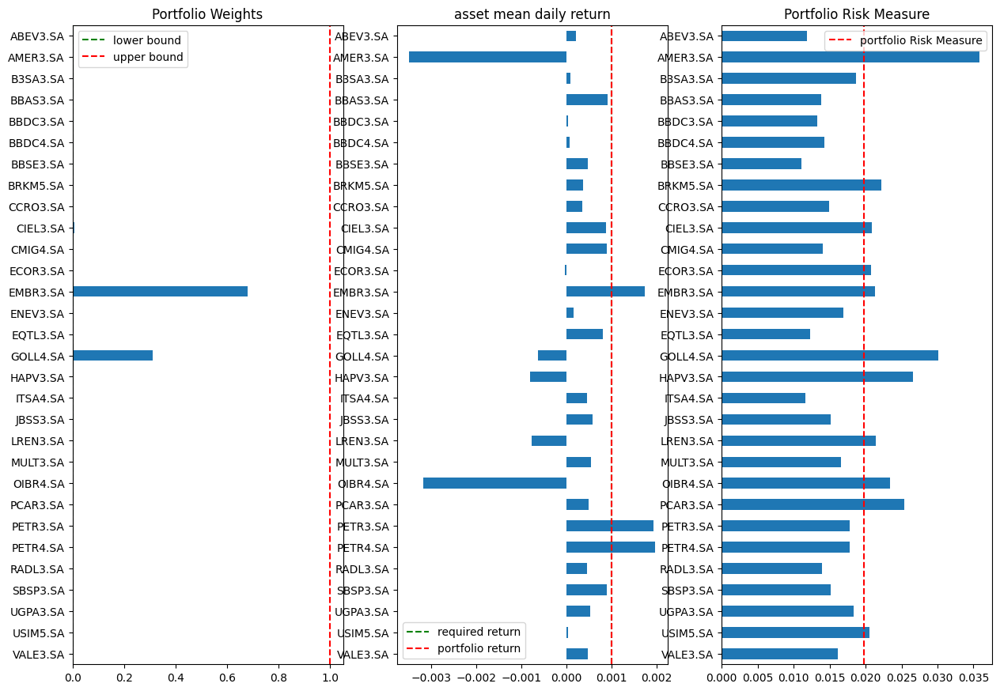

[*********************100%%**********************]  30 of 30 completed
HiGHS 1.6.0: HiGHS 1.6.0: unbounded problem
2959 simplex iterations
0 barrier iterations
 
Weight lower bound                0.000
Weight upper bound                1.000
Fraction of portfolio invested   1.000
Required portfolio daily return  0.00100
Portfolio mean daily return      0.00102
Portfolio risk measure (p=0.012): 0.01576


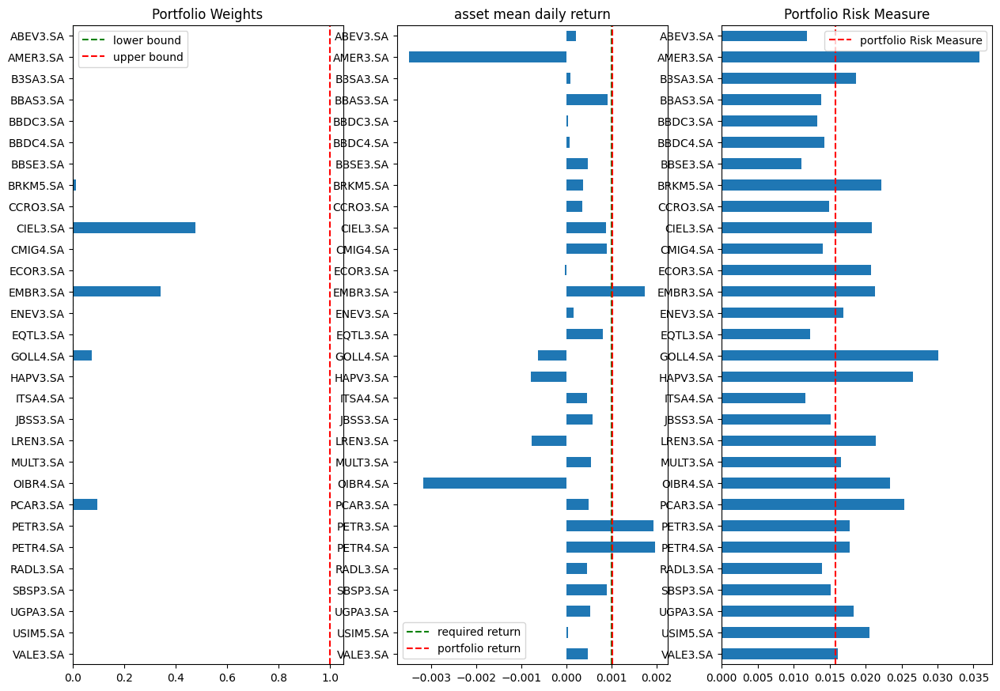

In [ ]:
def mad_portfolio_p_quantile(assets, p_quantile):
    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()

    daily_returns["Date"] = daily_returns.index.format()
    daily_returns.set_index("Date", inplace=True)

    ampl = AMPL()

    # Substitua pela leitura do arquivo .mod no seu diretório
    ampl.read("mad_portfolio_p_quantile.mod")

    ampl.set["ASSETS"] = list(assets.columns)
    ampl.set["TIME"] = daily_returns.index.values

    ampl.param["daily_returns"] = daily_returns
    ampl.param["mean_return"] = mean_return
    ampl.param["p_quantile"] = p_quantile  # Adiciona o parâmetro p_quantile

    return ampl

def mad_visualization(assets, m, p_quantile):
    mean_portfolio_return = m.get_value("sum{j in ASSETS}(w[j] * mean_return[j])")
    risk_measure = -m.obj["risk_measure"].value()
    mad_portfolio_weights = m.var["w"].to_pandas()

    print(f"Weight lower bound                {m.param['w_lb'].value():0.3f}")
    print(f"Weight upper bound                {m.param['w_ub'].value():0.3f}")
    print(f"Fraction of portfolio invested   {m.get_value('sum{j in ASSETS} w[j]'):0.3f}")
    print(f"Required portfolio daily return  {m.param['R'].value():0.5f}")
    print(f"Portfolio mean daily return      {mean_portfolio_return:0.5f}")
    print(f"Portfolio risk measure (p={p_quantile}): {risk_measure:0.5f}")

    daily_returns = assets.diff()[1:] / assets.shift(1)[1:]
    mean_return = daily_returns.mean()
    mean_risk = abs(daily_returns - mean_return).mean()

    fig, ax = plt.subplots(1, 3, figsize=(15, 0.35 * len(assets.columns)))
    mad_portfolio_weights.plot(kind="barh", ax=ax[0], title="Portfolio Weights")
    ax[0].invert_yaxis()
    ax[0].axvline(m.param["w_lb"].value(), ls="--", color="g")
    ax[0].axvline(m.param["w_ub"].value(), ls="--", color="r")
    ax[0].legend(["lower bound", "upper bound"])

    mean_return.plot(kind="barh", ax=ax[1], title="asset mean daily return")
    ax[1].axvline(m.param["R"].value(), ls="--", color="g")
    ax[1].axvline(mean_portfolio_return, ls="--", color="r")
    ax[1].invert_yaxis()
    ax[1].legend(["required return", "portfolio return"])

    mean_risk.plot(
        kind="barh", ax=ax[2], title="Portfolio Risk Measure"
    )
    ax[2].axvline(-m.obj["risk_measure"].value(), ls="--", color="r")
    ax[2].legend(["portfolio Risk Measure"])
    ax[2].invert_yaxis()

    plt.show()


# Substitua os valores abaixo pelos valores desejados (0.005, 0.01, 0.02)
for p_value in [0.005, 0.01, 0.012]:
    # Baixa os dados usando yfinance
    assets = yf.download(tickers, start=pd.to_datetime('today') - pd.DateOffset(years=3), end=pd.to_datetime('today'))["Adj Close"]

    # Cria o modelo para os ativos e o valor de p
    m = mad_portfolio_p_quantile(assets, p_quantile=p_value)

    # Configura os parâmetros e resolve o modelo
    m.param["w_ub"] = 1
    m.param["R"] = 0.001
    m.option["solver"] = SOLVER
    m.solve()

    # Visualiza os resultados
    mad_visualization(assets, m, p_value)

((Comparar com o MAD e validar a diferença nos resultados - apenas para o caso de 3 anos))